# Description
This dataset simulates the financial and ESG (Environmental, Social, and Governance) performance of 1,000 global companies across 9 industries and 7 regions from 2015 to 2025. It contains realistic financial metrics (e.g., revenue, profit margins, market capitalization) alongside comprehensive ESG indicators, including carbon emissions, resource usage, and detailed ESG scores.

| Column Name           | Description                                                           | Type                                         |  
|-----------------------|-----------------------------------------------------------------------|----------------------------------------------|  
| CompanyID             | Unique identifier for each synthetic company                          | Numeric                                      |  
| CompanyName           | Synthetic name (e.g., "Company_123")                                  | Categorical                                  |  
| Industry              | Industry sector (e.g., Technology, Finance, Energy)                   | Categorical                                  |  
| Region                | Geographic region (e.g., North America, Europe)                       | Categorical                                  |  
| Year                  | Reporting year (2015–2025)                                            | Numeric                                      |  
| Revenue               | Annual revenue in millions USD                                        | Numeric                                      |  
| ProfitMargin          | Net profit margin as percentage of revenue                            | Numeric                                      |  
| MarketCap             | Market capitalization in millions USD                                 | Numeric                                      |  
| GrowthRate            | Year-over-year revenue growth rate (%)                                | Numeric (NaN for 2015)                       |  
| ESG_Overall           | Aggregate ESG sustainability score (0–100)                            | Numeric                                      |  
| ESG_Environmental     | Environmental sustainability score (0–100)                            | Numeric                                      |  
| ESG_Social            | Social responsibility score (0–100)                                   | Numeric                                      |  
| ESG_Governance        | Corporate governance quality score (0–100)                            | Numeric                                      |  
| CarbonEmissions       | Annual carbon emissions in tons CO₂                                   | Numeric                                      |  
| WaterUsage            | Annual water usage in cubic meters                                    | Numeric                                      |  
| EnergyConsumption     | Annual energy consumption in megawatt-hours (MWh)                     | Numeric                                      |

In [1]:
import pandas as pd
import re
from sklearn.impute import KNNImputer
import numpy as np  
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.decomposition import PCA
import missingno as msno
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
df = pd.read_csv("company_esg_financial_dataset.csv")
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
sns.set(style='whitegrid')
%matplotlib inline

df

,CompanyID,CompanyName,Industry,Region,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption
0,1,Company_1,Retail,Latin America,2015,459.2,6.0,337.5,NaN,57.0,60.7,33.5,76.8,35577.4,17788.7,71154.7
1,1,Company_1,Retail,Latin America,2016,473.8,4.6,366.6,3.2,56.7,58.9,32.8,78.5,37314.7,18657.4,74629.4
2,1,Company_1,Retail,Latin America,2017,564.9,5.2,313.4,19.2,56.5,57.6,34.0,77.8,45006.4,22503.2,90012.9
3,1,Company_1,Retail,Latin America,2018,558.4,4.3,283.0,-1.1,58.0,62.3,33.4,78.3,42650.1,21325.1,85300.2
4,1,Company_1,Retail,Latin America,2019,554.5,4.9,538.1,-0.7,56.6,63.7,30.0,76.1,41799.4,20899.7,83598.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10995,1000,Company_1000,Consumer Goods,Latin America,2021,3419.2,21.7,14416.7,0.4,52.2,67.2,46.3,43.1,498875.8,623594.7,2494378.8
10996,1000,Company_1000,Consumer Goods,Latin America,2022,3518.8,21.4,8078.9,2.9,51.9,68.7,44.7,42.3,506013.7,632517.1,2530068.4
10997,1000,Company_1000,Consumer Goods,Latin America,2023,3417.1,17.1,13263.4,-2.9,52.9,72.4,43.1,43.2,473561.5,591951.9,2367807.7
10998,1000,Company_1000,Consumer Goods,Latin America,2024,3183.2,15.7,6960.1,-6.8,52.0,72.4,40.5,42.9,441310.9,551638.6,2206554.3


# EDA

In [3]:
# Basic info
print("Shape:", df.shape)
print("\nColumns and dtypes:")
print(df.dtypes)

# Top / bottom rows
display(df.head())
display(df.tail())

# Quick summary
display(df.info())
display(df.describe(include='all').T)  # summary for numeric and non-numeric

# Check for duplicates
print("\n=== Duplicate Rows ===")
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

# Statistical summary insights
print("\n=== Key Statistical Insights ===")
print(f"Total companies: {df['CompanyID'].nunique()}")
print(f"Industries: {df['Industry'].nunique()} - {df['Industry'].unique()}")
print(f"Regions: {df['Region'].nunique()} - {df['Region'].unique()}")
print(f"Year range: {df['Year'].min()} to {df['Year'].max()}")
print(f"\nRevenue statistics:")
print(f"  Mean: ${df['Revenue'].mean():,.2f}M")
print(f"  Median: ${df['Revenue'].median():,.2f}M")
print(f"  Min: ${df['Revenue'].min():,.2f}M")
print(f"  Max: ${df['Revenue'].max():,.2f}M")

Shape: (11000, 16)

Columns and dtypes:
CompanyID              int64
CompanyName           object
Industry              object
Region                object
Year                   int64
Revenue              float64
ProfitMargin         float64
MarketCap            float64
GrowthRate           float64
ESG_Overall          float64
ESG_Environmental    float64
ESG_Social           float64
ESG_Governance       float64
CarbonEmissions      float64
WaterUsage           float64
EnergyConsumption    float64
dtype: object


,CompanyID,CompanyName,Industry,Region,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption
0,1,Company_1,Retail,Latin America,2015,459.2,6.0,337.5,NaN,57.0,60.7,33.5,76.8,35577.4,17788.7,71154.7
1,1,Company_1,Retail,Latin America,2016,473.8,4.6,366.6,3.2,56.7,58.9,32.8,78.5,37314.7,18657.4,74629.4
2,1,Company_1,Retail,Latin America,2017,564.9,5.2,313.4,19.2,56.5,57.6,34.0,77.8,45006.4,22503.2,90012.9
3,1,Company_1,Retail,Latin America,2018,558.4,4.3,283.0,-1.1,58.0,62.3,33.4,78.3,42650.1,21325.1,85300.2
4,1,Company_1,Retail,Latin America,2019,554.5,4.9,538.1,-0.7,56.6,63.7,30.0,76.1,41799.4,20899.7,83598.8


,CompanyID,CompanyName,Industry,Region,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption
10995,1000,Company_1000,Consumer Goods,Latin America,2021,3419.2,21.7,14416.7,0.4,52.2,67.2,46.3,43.1,498875.8,623594.7,2494378.8
10996,1000,Company_1000,Consumer Goods,Latin America,2022,3518.8,21.4,8078.9,2.9,51.9,68.7,44.7,42.3,506013.7,632517.1,2530068.4
10997,1000,Company_1000,Consumer Goods,Latin America,2023,3417.1,17.1,13263.4,-2.9,52.9,72.4,43.1,43.2,473561.5,591951.9,2367807.7
10998,1000,Company_1000,Consumer Goods,Latin America,2024,3183.2,15.7,6960.1,-6.8,52.0,72.4,40.5,42.9,441310.9,551638.6,2206554.3
10999,1000,Company_1000,Consumer Goods,Latin America,2025,3173.5,17.5,5666.1,-0.3,51.8,74.5,39.7,41.4,430741.6,538427.0,2153707.9


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CompanyID          11000 non-null  int64  
 1   CompanyName        11000 non-null  object 
 2   Industry           11000 non-null  object 
 3   Region             11000 non-null  object 
 4   Year               11000 non-null  int64  
 5   Revenue            11000 non-null  float64
 6   ProfitMargin       11000 non-null  float64
 7   MarketCap          11000 non-null  float64
 8   GrowthRate         10000 non-null  float64
 9   ESG_Overall        11000 non-null  float64
 10  ESG_Environmental  11000 non-null  float64
 11  ESG_Social         11000 non-null  float64
 12  ESG_Governance     11000 non-null  float64
 13  CarbonEmissions    11000 non-null  float64
 14  WaterUsage         11000 non-null  float64
 15  EnergyConsumption  11000 non-null  float64
dtypes: float64(11), int64(

None

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CompanyID,11000.0,NaN,NaN,NaN,500.5,288.688113,1.0,250.75,500.5,750.25,1000.0
CompanyName,11000,1000,Company_1000,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Industry,11000,9,Healthcare,1331,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region,11000,7,Asia,1672,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,11000.0,NaN,NaN,NaN,2020.0,3.162421,2015.0,2017.0,2020.0,2023.0,2025.0
Revenue,11000.0,NaN,NaN,NaN,4670.850591,9969.954369,35.9,938.775,1902.3,4342.625,180810.4
ProfitMargin,11000.0,NaN,NaN,NaN,10.900455,8.758711,-20.0,5.3,10.5,16.3,50.0
MarketCap,11000.0,NaN,NaN,NaN,13380.622236,39922.870373,1.8,1098.525,3096.45,9995.5,865271.7
GrowthRate,10000.0,NaN,NaN,NaN,4.83037,9.424787,-36.0,-1.325,4.9,11.0,38.0
ESG_Overall,11000.0,NaN,NaN,NaN,54.615273,15.893937,6.3,44.1,54.6,65.6,98.8



=== Duplicate Rows ===
Number of duplicate rows: 0

=== Key Statistical Insights ===
Total companies: 1000
Industries: 9 - ['Retail' 'Transportation' 'Technology' 'Finance' 'Healthcare' 'Energy'
 'Consumer Goods' 'Utilities' 'Manufacturing']
Regions: 7 - ['Latin America' 'Asia' 'Africa' 'Middle East' 'Oceania' 'Europe'
 'North America']
Year range: 2015 to 2025

Revenue statistics:
  Mean: $4,670.85M
  Median: $1,902.30M
  Min: $35.90M
  Max: $180,810.40M


## Comprehensive Exploratory Data Analysis (EDA)

### 1. Correlation Analysis
Understanding relationships between financial metrics and ESG scores.


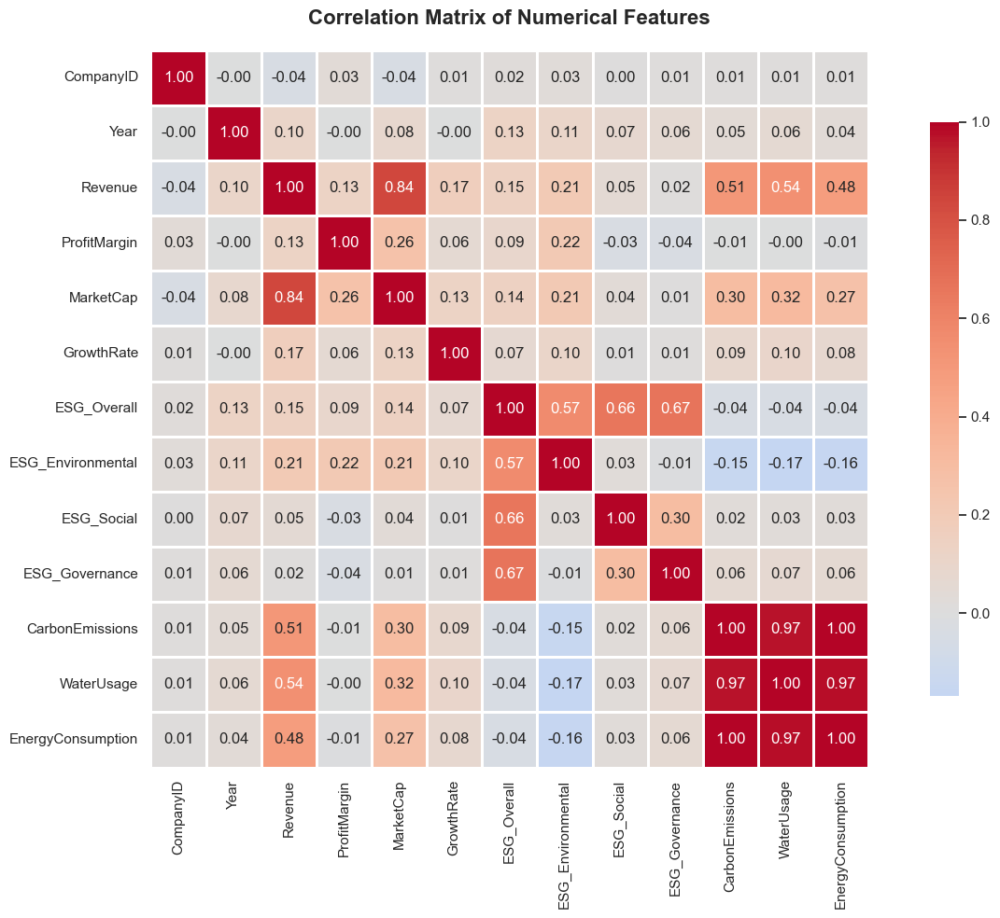

=== Key Correlations ===

ESG Scores vs Financial Metrics:

ESG_Overall:
  vs Revenue: 0.149
  vs ProfitMargin: 0.088
  vs MarketCap: 0.144
  vs GrowthRate: 0.068

ESG_Environmental:
  vs Revenue: 0.207
  vs ProfitMargin: 0.219
  vs MarketCap: 0.215
  vs GrowthRate: 0.102

ESG_Social:
  vs Revenue: 0.047
  vs ProfitMargin: -0.033
  vs MarketCap: 0.039
  vs GrowthRate: 0.007

ESG_Governance:
  vs Revenue: 0.018
  vs ProfitMargin: -0.035
  vs MarketCap: 0.008
  vs GrowthRate: 0.014

ESG vs Environmental Impact:

ESG_Overall:
  vs CarbonEmissions: -0.040
  vs WaterUsage: -0.043
  vs EnergyConsumption: -0.044

ESG_Environmental:
  vs CarbonEmissions: -0.152
  vs WaterUsage: -0.168
  vs EnergyConsumption: -0.158


In [4]:
# Correlation matrix for numerical features
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
correlation_matrix = df[numerical_cols].corr()

# Visualize correlation matrix
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Key correlation insights
print("=== Key Correlations ===")
print("\nESG Scores vs Financial Metrics:")
for esg_col in ['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']:
    if esg_col in correlation_matrix.columns:
        print(f"\n{esg_col}:")
        print(f"  vs Revenue: {correlation_matrix.loc[esg_col, 'Revenue']:.3f}")
        print(f"  vs ProfitMargin: {correlation_matrix.loc[esg_col, 'ProfitMargin']:.3f}")
        print(f"  vs MarketCap: {correlation_matrix.loc[esg_col, 'MarketCap']:.3f}")
        print(f"  vs GrowthRate: {correlation_matrix.loc[esg_col, 'GrowthRate']:.3f}")

print("\nESG vs Environmental Impact:")
for esg_col in ['ESG_Overall', 'ESG_Environmental']:
    if esg_col in correlation_matrix.columns:
        print(f"\n{esg_col}:")
        print(f"  vs CarbonEmissions: {correlation_matrix.loc[esg_col, 'CarbonEmissions']:.3f}")
        print(f"  vs WaterUsage: {correlation_matrix.loc[esg_col, 'WaterUsage']:.3f}")
        print(f"  vs EnergyConsumption: {correlation_matrix.loc[esg_col, 'EnergyConsumption']:.3f}")


### 2. Distribution Analysis by Industry and Region


In [5]:
# Industry and Region distribution analysis
print("=== Industry Distribution ===")
industry_counts = df['Industry'].value_counts()
print(industry_counts)
print(f"\nPercentage distribution:")
print((industry_counts / len(df) * 100).round(2))

print("\n=== Region Distribution ===")
region_counts = df['Region'].value_counts()
print(region_counts)
print(f"\nPercentage distribution:")
print((region_counts / len(df) * 100).round(2))

# Average metrics by Industry
print("\n=== Average Metrics by Industry ===")
industry_metrics = df.groupby('Industry').agg({
    'Revenue': 'mean',
    'ProfitMargin': 'mean',
    'ESG_Overall': 'mean',
    'CarbonEmissions': 'mean'
}).round(2)
display(industry_metrics)

# Average metrics by Region
print("\n=== Average Metrics by Region ===")
region_metrics = df.groupby('Region').agg({
    'Revenue': 'mean',
    'ProfitMargin': 'mean',
    'ESG_Overall': 'mean',
    'CarbonEmissions': 'mean'
}).round(2)
display(region_metrics)


=== Industry Distribution ===
Industry
Healthcare        1331
Manufacturing     1287
Transportation    1287
Consumer Goods    1276
Finance           1243
Energy            1188
Utilities         1177
Retail            1166
Technology        1045
Name: count, dtype: int64

Percentage distribution:
Industry
Healthcare        12.1
Manufacturing     11.7
Transportation    11.7
Consumer Goods    11.6
Finance           11.3
Energy            10.8
Utilities         10.7
Retail            10.6
Technology         9.5
Name: count, dtype: float64

=== Region Distribution ===
Region
Asia             1672
Oceania          1661
Middle East      1617
Europe           1540
North America    1540
Latin America    1507
Africa           1463
Name: count, dtype: int64

Percentage distribution:
Region
Asia             15.2
Oceania          15.1
Middle East      14.7
Europe           14.0
North America    14.0
Latin America    13.7
Africa           13.3
Name: count, dtype: float64

=== Average Metrics by Ind

,Revenue,ProfitMargin,ESG_Overall,CarbonEmissions
Industry,,,,
Consumer Goods,2098.92,10.81,54.83,340368.45
Energy,8799.24,10.55,49.01,8191264.71
Finance,6273.96,14.29,64.62,72050.45
Healthcare,4653.70,15.45,57.25,335329.19
Manufacturing,2313.85,8.49,50.46,623596.85
Retail,1613.26,5.49,55.68,129712.59
Technology,15772.70,18.80,63.35,450418.73
Transportation,1125.98,5.37,46.03,650314.92
Utilities,1244.21,9.68,51.60,869341.08



=== Average Metrics by Region ===


,Revenue,ProfitMargin,ESG_Overall,CarbonEmissions
Region,,,,
Africa,4061.01,11.37,44.51,1134892.19
Asia,4182.60,11.34,51.90,1119859.43
Europe,5594.86,10.29,67.87,1552770.45
Latin America,5666.64,10.38,50.52,1132198.58
Middle East,4176.84,10.77,43.44,887571.76
North America,4694.10,11.29,61.22,1538794.57
Oceania,4398.68,10.85,62.44,1535759.55


### 3. Outlier Detection


In [6]:
# Outlier detection using IQR method
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Check outliers in key numerical columns
numerical_cols_to_check = ['Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate', 
                           'ESG_Overall', 'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']

print("=== Outlier Detection (IQR Method) ===")
outlier_summary = {}
for col in numerical_cols_to_check:
    if col in df.columns:
        outliers, lower, upper = detect_outliers_iqr(df, col)
        outlier_count = len(outliers)
        outlier_pct = (outlier_count / len(df)) * 100
        outlier_summary[col] = {
            'count': outlier_count,
            'percentage': outlier_pct,
            'lower_bound': lower,
            'upper_bound': upper
        }
        print(f"\n{col}:")
        print(f"  Outliers: {outlier_count} ({outlier_pct:.2f}%)")
        print(f"  Bounds: [{lower:.2f}, {upper:.2f}]")

# Create outlier summary dataframe
outlier_df = pd.DataFrame(outlier_summary).T
display(outlier_df)


=== Outlier Detection (IQR Method) ===

Revenue:
  Outliers: 1202 (10.93%)
  Bounds: [-4167.00, 9448.40]

ProfitMargin:
  Outliers: 196 (1.78%)
  Bounds: [-11.20, 32.80]

MarketCap:
  Outliers: 1354 (12.31%)
  Bounds: [-12246.94, 23340.96]

GrowthRate:
  Outliers: 111 (1.01%)
  Bounds: [-19.81, 29.49]

ESG_Overall:
  Outliers: 13 (0.12%)
  Bounds: [11.85, 97.85]

CarbonEmissions:
  Outliers: 1289 (11.72%)
  Bounds: [-803964.31, 1667548.39]

WaterUsage:
  Outliers: 1129 (10.26%)
  Bounds: [-625570.27, 1215642.92]

EnergyConsumption:
  Outliers: 1430 (13.00%)
  Bounds: [-7657364.78, 13580717.62]


,count,percentage,lower_bound,upper_bound
Revenue,1202.0,10.927273,-4.167000e+03,9.448400e+03
ProfitMargin,196.0,1.781818,-1.120000e+01,3.280000e+01
MarketCap,1354.0,12.309091,-1.224694e+04,2.334096e+04
GrowthRate,111.0,1.009091,-1.981250e+01,2.948750e+01
ESG_Overall,13.0,0.118182,1.185000e+01,9.785000e+01
CarbonEmissions,1289.0,11.718182,-8.039643e+05,1.667548e+06
WaterUsage,1129.0,10.263636,-6.255703e+05,1.215643e+06
EnergyConsumption,1430.0,13.000000,-7.657365e+06,1.358072e+07


## Data Cleaning - Complete Process

### 1.Handle Missing Data/Duplicates



I used the required codes to find missing data, and used msno to find a specific pattern in the missing data.

,missing_count,missing_percent
GrowthRate,1000,9.09


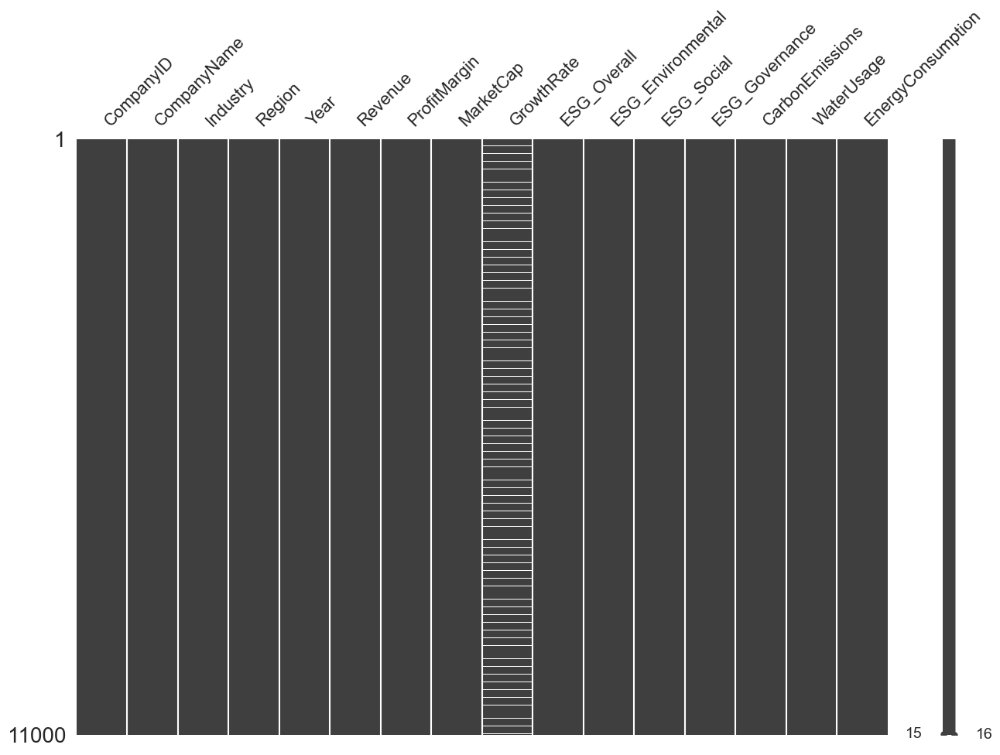

In [7]:
# Missing counts & percent
missing = df.isnull().sum().sort_values(ascending=False)
missing_pct = (missing / len(df) * 100).round(2)
missing_table = pd.concat([missing, missing_pct], axis=1)
missing_table.columns = ['missing_count', 'missing_percent']
display(missing_table[missing_table.missing_count > 0])

# Visualize missing pattern
msno.matrix(df, figsize=(15,10))
plt.show()


I retrieved the cases in the Growthrate column that had NaN.
The years 2015 were not available because the data for previous years was not collected in the dataset.

And since deleting this year does not affect data for later years, as it would in Excel, we can drop it.

In [8]:
df[df["GrowthRate"].isna()]
df.dropna(inplace=True)

In [9]:
# Check and remove duplicates
print(f"Shape before removing duplicates: {df.shape}")
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

if duplicate_count > 0:
    df = df.drop_duplicates()
    print(f"Shape after removing duplicates: {df.shape}")
else:
    print("No duplicates found. Data is clean.")


Shape before removing duplicates: (10000, 16)
Number of duplicate rows: 0
No duplicates found. Data is clean.


### 2. Handle Outliers
We'll cap outliers using IQR method for key financial and ESG metrics to prevent extreme values from skewing the analysis.


In [10]:
# Cap outliers using IQR method for key columns
def cap_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap values
    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)
    return df

# Cap outliers for key numerical columns (excluding ID and Year)
columns_to_cap = ['Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate', 
                  'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']

print("=== Capping Outliers ===")
for col in columns_to_cap:
    if col in df.columns:
        before_min, before_max = df[col].min(), df[col].max()
        df = cap_outliers_iqr(df, col)
        after_min, after_max = df[col].min(), df[col].max()
        print(f"{col}: [{before_min:.2f}, {before_max:.2f}] -> [{after_min:.2f}, {after_max:.2f}]")

print(f"\nFinal shape: {df.shape}")


=== Capping Outliers ===
Revenue: [35.90, 180810.40] -> [35.90, 9712.41]
ProfitMargin: [-20.00, 50.00] -> [-11.60, 33.20]
MarketCap: [1.80, 865271.70] -> [1.80, 24224.49]
GrowthRate: [-36.00, 38.00] -> [-19.81, 29.49]
CarbonEmissions: [2042.20, 174104721.40] -> [2042.20, 1688399.76]
WaterUsage: [1021.10, 52231416.40] -> [1021.10, 1232558.14]
EnergyConsumption: [5105.50, 1741047214.30] -> [5105.50, 13680036.09]

Final shape: (10000, 16)


### 3. Validate Data Ranges
Ensure all values are within expected ranges.


In [11]:
# Validate data ranges

ESG_Values = ['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']

print("=== Data Validation ===")


# Check ESG scores (0-100)
for col in ESG_Values:
    if col in df.columns:
        invalid = df[(df[col] < 0) | (df[col] > 100)]
        if len(invalid) > 0:
            print(f"WARNING: {col} has {len(invalid)} values outside [0, 100]")
            df.loc[(df[col] < 0) | (df[col] > 100), col] = df[col].clip(0, 100)
        else:
            print(f"✓ {col}: All values in valid range [0, 100]")

# Check ProfitMargin (typically -100 to 100, but we'll check for extreme values)
if 'ProfitMargin' in df.columns:
    extreme_profit = df[(df['ProfitMargin'] < -100) | (df['ProfitMargin'] > 100)]
    if len(extreme_profit) > 0:
        print(f"WARNING: ProfitMargin has {len(extreme_profit)} extreme values")
        df['ProfitMargin'] = df['ProfitMargin'].clip(-100, 100)
    else:
        print("✓ ProfitMargin: Values within reasonable range")

# Check for negative values in metrics that should be positive
positive_cols = ['Revenue', 'MarketCap', 'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']
for col in positive_cols:
    if col in df.columns:
        negative_count = (df[col] < 0).sum()
        if negative_count > 0:
            print(f"WARNING: {col} has {negative_count} negative values - setting to 0")
            df[col] = df[col].clip(lower=0)
        else:
            print(f"✓ {col}: No negative values")

print("\n=== Data Validation Complete ===")


=== Data Validation ===
✓ ESG_Overall: All values in valid range [0, 100]
✓ ESG_Environmental: All values in valid range [0, 100]
✓ ESG_Social: All values in valid range [0, 100]
✓ ESG_Governance: All values in valid range [0, 100]
✓ ProfitMargin: Values within reasonable range
✓ Revenue: No negative values
✓ MarketCap: No negative values
✓ CarbonEmissions: No negative values
✓ WaterUsage: No negative values
✓ EnergyConsumption: No negative values

=== Data Validation Complete ===


## Feature Engineering

Feature engineering involves creating new features from existing data to improve model performance. We'll create features using various techniques including ratios, binning, mathematical functions, feature combinations, date/time transformations, and aggregation statistics.


### 1. Ratio Features

Ratios provide normalized comparisons between related metrics, making them scale-independent and often more informative than raw values.


In [12]:
# Create a working copy from the original cleaned data (before standardization)
df_fe = df.copy()

# Financial Ratios
print("=== Creating Ratio Features ===")

# Revenue efficiency ratios
df_fe['Revenue_to_MarketCap'] = df_fe['Revenue'] / (df_fe['MarketCap'] + 1)  # +1 to avoid division by zero
df_fe['MarketCap_to_Revenue'] = df_fe['MarketCap'] / (df_fe['Revenue'] + 1)

# ESG efficiency ratios
df_fe['ESG_to_Revenue'] = df_fe['ESG_Overall'] / (df_fe['Revenue'] + 1)
df_fe['ESG_to_Profit'] = df_fe['ESG_Overall'] / (abs(df_fe['ProfitMargin']) + 1)

# Environmental impact ratios (lower is better)
df_fe['Carbon_to_Revenue'] = df_fe['CarbonEmissions'] / (df_fe['Revenue'] + 1)
df_fe['Water_to_Revenue'] = df_fe['WaterUsage'] / (df_fe['Revenue'] + 1)
df_fe['Energy_to_Revenue'] = df_fe['EnergyConsumption'] / (df_fe['Revenue'] + 1)

# ESG component ratios
df_fe['Env_to_Social'] = df_fe['ESG_Environmental'] / (df_fe['ESG_Social'] + 1)
df_fe['Gov_to_Social'] = df_fe['ESG_Governance'] / (df_fe['ESG_Social'] + 1)
df_fe['Env_to_Gov'] = df_fe['ESG_Environmental'] / (df_fe['ESG_Governance'] + 1)

# Environmental impact ratios
df_fe['Carbon_to_Energy'] = df_fe['CarbonEmissions'] / (df_fe['EnergyConsumption'] + 1)
df_fe['Water_to_Energy'] = df_fe['WaterUsage'] / (df_fe['EnergyConsumption'] + 1)

# Store ratio features list
ratio_features = [col for col in df_fe.columns if col not in df.columns]

print(f"Created {len(ratio_features)} ratio features")
print(f"New ratio features: {ratio_features}")

# Display summary statistics of new ratio features
print("\n=== Summary Statistics of Ratio Features ===")
display(df_fe[ratio_features].describe().T)


=== Creating Ratio Features ===
Created 12 ratio features
New ratio features: ['Revenue_to_MarketCap', 'MarketCap_to_Revenue', 'ESG_to_Revenue', 'ESG_to_Profit', 'Carbon_to_Revenue', 'Water_to_Revenue', 'Energy_to_Revenue', 'Env_to_Social', 'Gov_to_Social', 'Env_to_Gov', 'Carbon_to_Energy', 'Water_to_Energy']

=== Summary Statistics of Ratio Features ===


,count,mean,std,min,25%,50%,75%,max
Revenue_to_MarketCap,10000.0,1.415450,7.236095,0.090786,0.387389,0.553718,0.983761,427.474576
MarketCap_to_Revenue,10000.0,2.002035,1.312581,0.001942,1.014907,1.804602,2.576537,11.009233
ESG_to_Revenue,10000.0,0.042681,0.057268,0.001062,0.011573,0.026594,0.054095,1.826558
ESG_to_Profit,10000.0,7.446422,8.439410,0.351955,2.980382,4.613541,8.074709,87.181818
Carbon_to_Revenue,10000.0,261.445005,255.567141,9.952821,66.313454,173.821483,443.315367,1157.086738
Water_to_Revenue,10000.0,160.665546,146.142426,4.976654,40.324393,103.778892,254.084481,585.397007
Energy_to_Revenue,10000.0,1996.454755,2499.217998,24.882296,132.626900,858.132117,3119.767006,11570.866925
Env_to_Social,10000.0,1.324700,1.562448,0.000000,0.610742,0.999424,1.559650,47.200000
Gov_to_Social,10000.0,1.095045,0.897707,0.000000,0.577953,0.917827,1.351226,16.585366
Env_to_Gov,10000.0,1.800160,3.836959,0.000000,0.642774,1.043641,1.828006,100.000000


### 2. Binning Features

Binning converts continuous variables into categorical bins, which can help capture non-linear relationships and reduce the impact of outliers.


In [13]:
# Binning continuous variables
print("=== Creating Binning Features ===")

# ESG Score Binning (Low, Medium, High)
df_fe['ESG_Overall_Bin'] = pd.cut(df_fe['ESG_Overall'], 
                                   bins=[0, 40, 70, 100], 
                                   labels=['Low', 'Medium', 'High'])
df_fe['ESG_Environmental_Bin'] = pd.cut(df_fe['ESG_Environmental'], 
                                        bins=[0, 40, 70, 100], 
                                        labels=['Low', 'Medium', 'High'])

# Revenue Binning (Small, Medium, Large, Enterprise)
revenue_quantiles = df_fe['Revenue'].quantile([0.25, 0.5, 0.75])
df_fe['Revenue_Bin'] = pd.cut(df_fe['Revenue'], 
                              bins=[0, revenue_quantiles[0.25], revenue_quantiles[0.5], 
                                    revenue_quantiles[0.75], df_fe['Revenue'].max()],
                              labels=['Small', 'Medium', 'Large', 'Enterprise'])

# Market Cap Binning
marketcap_quantiles = df_fe['MarketCap'].quantile([0.25, 0.5, 0.75])
df_fe['MarketCap_Bin'] = pd.cut(df_fe['MarketCap'], 
                                bins=[0, marketcap_quantiles[0.25], marketcap_quantiles[0.5], 
                                      marketcap_quantiles[0.75], df_fe['MarketCap'].max()],
                                labels=['Small Cap', 'Mid Cap', 'Large Cap', 'Mega Cap'])

# Profit Margin Binning (Loss, Low, Medium, High)
df_fe['ProfitMargin_Bin'] = pd.cut(df_fe['ProfitMargin'], 
                                   bins=[df_fe['ProfitMargin'].min(), 0, 5, 15, df_fe['ProfitMargin'].max()],
                                   labels=['Loss', 'Low', 'Medium', 'High'])

# Growth Rate Binning
growth_quantiles = df_fe['GrowthRate'].quantile([0.25, 0.5, 0.75])
df_fe['GrowthRate_Bin'] = pd.cut(df_fe['GrowthRate'], 
                                 bins=[df_fe['GrowthRate'].min(), growth_quantiles[0.25], 
                                       growth_quantiles[0.5], growth_quantiles[0.75], df_fe['GrowthRate'].max()],
                                 labels=['Declining', 'Stable', 'Growing', 'High Growth'])

# Carbon Emissions Binning (based on environmental impact)
carbon_quantiles = df_fe['CarbonEmissions'].quantile([0.33, 0.67])
df_fe['CarbonEmissions_Bin'] = pd.cut(df_fe['CarbonEmissions'], 
                                      bins=[0, carbon_quantiles[0.33], carbon_quantiles[0.67], 
                                            df_fe['CarbonEmissions'].max()],
                                      labels=['Low Impact', 'Medium Impact', 'High Impact'])

print(f"Created {len([col for col in df_fe.columns if '_Bin' in col])} binning features")
print(f"Binning features: {[col for col in df_fe.columns if '_Bin' in col]}")

# Display value counts for binning features
print("\n=== Value Counts of Binning Features ===")
for col in [c for c in df_fe.columns if '_Bin' in c]:
    print(f"\n{col}:")
    print(df_fe[col].value_counts())


=== Creating Binning Features ===
Created 7 binning features
Binning features: ['ESG_Overall_Bin', 'ESG_Environmental_Bin', 'Revenue_Bin', 'MarketCap_Bin', 'ProfitMargin_Bin', 'GrowthRate_Bin', 'CarbonEmissions_Bin']

=== Value Counts of Binning Features ===

ESG_Overall_Bin:
ESG_Overall_Bin
Medium    6446
High      1792
Low       1762
Name: count, dtype: int64

ESG_Environmental_Bin:
ESG_Environmental_Bin
Medium    3541
High      3416
Low       3038
Name: count, dtype: int64

Revenue_Bin:
Revenue_Bin
Medium        2501
Small         2500
Enterprise    2500
Large         2499
Name: count, dtype: int64

MarketCap_Bin:
MarketCap_Bin
Small Cap    2500
Mid Cap      2500
Large Cap    2500
Mega Cap     2500
Name: count, dtype: int64

ProfitMargin_Bin:
ProfitMargin_Bin
Medium    4571
High      2963
Low       1504
Loss       872
Name: count, dtype: int64

GrowthRate_Bin:
GrowthRate_Bin
Stable         2525
High Growth    2499
Growing        2476
Declining      2433
Name: count, dtype: int64

Ca

### 3. Mathematical Function Features

Mathematical transformations can help normalize distributions, capture non-linear relationships, and improve model performance.


In [14]:
# Mathematical transformations
print("=== Creating Mathematical Function Features ===")

# Logarithmic transformations (handle zero/negative values)
df_fe['Log_Revenue'] = np.log1p(df_fe['Revenue'])  # log1p handles zeros
df_fe['Log_MarketCap'] = np.log1p(df_fe['MarketCap'])
df_fe['Log_CarbonEmissions'] = np.log1p(df_fe['CarbonEmissions'])
df_fe['Log_EnergyConsumption'] = np.log1p(df_fe['EnergyConsumption'])

# Square root transformations
df_fe['Sqrt_Revenue'] = np.sqrt(df_fe['Revenue'])
df_fe['Sqrt_MarketCap'] = np.sqrt(df_fe['MarketCap'])

# Square transformations (capture quadratic relationships)
df_fe['Square_ESG_Overall'] = df_fe['ESG_Overall'] ** 2
df_fe['Square_ProfitMargin'] = df_fe['ProfitMargin'] ** 2

# Exponential transformations (for growth-related features)
df_fe['Exp_GrowthRate'] = np.exp(df_fe['GrowthRate'] / 100)  # Normalize first

# Polynomial features (interactions)
df_fe['ESG_Revenue_Interaction'] = df_fe['ESG_Overall'] * df_fe['Revenue']
df_fe['Profit_ESG_Interaction'] = df_fe['ProfitMargin'] * df_fe['ESG_Overall']
df_fe['MarketCap_ESG_Interaction'] = df_fe['MarketCap'] * df_fe['ESG_Overall']

# Normalized features (using min-max scaling manually for specific features)
df_fe['Norm_ESG_Overall'] = (df_fe['ESG_Overall'] - df_fe['ESG_Overall'].min()) / (df_fe['ESG_Overall'].max() - df_fe['ESG_Overall'].min())
df_fe['Norm_Revenue'] = (df_fe['Revenue'] - df_fe['Revenue'].min()) / (df_fe['Revenue'].max() - df_fe['Revenue'].min())

print(f"Created {len([col for col in df_fe.columns if any(x in col for x in ['Log_', 'Sqrt_', 'Square_', 'Exp_', '_Interaction', 'Norm_'])])} mathematical function features")

# Display summary statistics
math_features = [col for col in df_fe.columns if any(x in col for x in ['Log_', 'Sqrt_', 'Square_', 'Exp_', '_Interaction', 'Norm_'])]
print("\n=== Summary Statistics of Mathematical Function Features ===")
display(df_fe[math_features].describe().T)


=== Creating Mathematical Function Features ===
Created 14 mathematical function features

=== Summary Statistics of Mathematical Function Features ===


,count,mean,std,min,25%,50%,75%,max
Log_Revenue,10000.0,7.614818,1.009539,3.608212,6.861423,7.577020,8.402500,9.181263e+00
Log_MarketCap,10000.0,8.030541,1.482754,1.029619,7.018446,8.068184,9.245748,1.009516e+01
Log_CarbonEmissions,10000.0,12.554567,1.251638,7.622272,11.742541,12.598927,13.528958,1.433929e+01
Log_EnergyConsumption,10000.0,14.007302,1.736115,8.538270,12.657380,14.028783,15.549015,1.643145e+01
Sqrt_Revenue,10000.0,50.950143,25.184982,5.991661,30.882438,44.179181,66.762265,9.855157e+01
Sqrt_MarketCap,10000.0,70.593443,45.984456,1.341641,33.407334,56.482741,101.781259,1.556422e+02
Square_ESG_Overall,10000.0,3269.435191,1761.496403,39.690000,1971.360000,3025.000000,4342.810000,9.761440e+03
Square_ProfitMargin,10000.0,193.818167,223.631431,0.000000,33.640000,116.640000,268.960000,1.102240e+03
Exp_GrowthRate,10000.0,1.054167,0.098080,0.820267,0.986837,1.050220,1.116278,1.342958e+00
ESG_Revenue_Interaction,10000.0,185877.765425,197410.937388,2419.660000,48049.072500,101427.955000,251891.065000,9.595864e+05


### 4. Feature Combinations

Combining multiple features can reveal complex relationships that individual features might miss.


In [15]:
# Feature combinations
print("=== Creating Feature Combination Features ===")

# ESG composite scores
df_fe['ESG_Avg_Components'] = (df_fe['ESG_Environmental'] + df_fe['ESG_Social'] + df_fe['ESG_Governance']) / 3
df_fe['ESG_Weighted'] = (df_fe['ESG_Environmental'] * 0.4 + 
                         df_fe['ESG_Social'] * 0.3 + 
                         df_fe['ESG_Governance'] * 0.3)

# Environmental impact composite
df_fe['Env_Impact_Score'] = (df_fe['CarbonEmissions'] / df_fe['CarbonEmissions'].max() * 0.5 +
                             df_fe['WaterUsage'] / df_fe['WaterUsage'].max() * 0.3 +
                             df_fe['EnergyConsumption'] / df_fe['EnergyConsumption'].max() * 0.2)

# Financial health composite
df_fe['Financial_Health'] = (df_fe['ProfitMargin'] / df_fe['ProfitMargin'].max() * 0.4 +
                            df_fe['GrowthRate'] / df_fe['GrowthRate'].max() * 0.3 +
                            (df_fe['Revenue'] / df_fe['Revenue'].max()) * 0.3)

# ESG-Financial balance score
df_fe['ESG_Financial_Balance'] = (df_fe['ESG_Overall'] / 100) * (df_fe['ProfitMargin'] / 100)

# Industry-Region combination
df_fe['Industry_Region'] = df_fe['Industry'].astype(str) + '_' + df_fe['Region'].astype(str)

# Year-Industry combination
df_fe['Year_Industry'] = df_fe['Year'].astype(str) + '_' + df_fe['Industry'].astype(str)

# Sustainability efficiency (ESG per unit of environmental impact)
df_fe['Sustainability_Efficiency'] = df_fe['ESG_Overall'] / (df_fe['Env_Impact_Score'] + 1)

# Profitability per ESG point
df_fe['Profit_per_ESG'] = df_fe['ProfitMargin'] / (df_fe['ESG_Overall'] + 1)

# Use ratio_features if available, otherwise calculate
try:
    ratio_features_list = ratio_features
except NameError:
    ratio_features_list = [col for col in df_fe.columns if col not in df.columns and 
                          any(x in col for x in ['_to_', '_per_'])]

combo_new_features = [col for col in df_fe.columns if col not in df.columns and '_Bin' not in col and 
                     not any(x in col for x in ['Log_', 'Sqrt_', 'Square_', 'Exp_', '_Interaction', 'Norm_']) and
                     col not in ratio_features_list]

print(f"Created {len(combo_new_features)} combination features")

# Display summary statistics
combo_features = ['ESG_Avg_Components', 'ESG_Weighted', 'Env_Impact_Score', 'Financial_Health', 
                 'ESG_Financial_Balance', 'Sustainability_Efficiency', 'Profit_per_ESG']
combo_features = [col for col in combo_features if col in df_fe.columns]
print("\n=== Summary Statistics of Combination Features ===")
display(df_fe[combo_features].describe().T)


=== Creating Feature Combination Features ===
Created 9 combination features

=== Summary Statistics of Combination Features ===


,count,mean,std,min,25%,50%,75%,max
ESG_Avg_Components,10000.0,54.932430,15.870893,6.300000,44.433333,54.966667,65.900000,98.766667
ESG_Weighted,10000.0,55.125994,15.950743,5.670000,44.557500,55.305000,66.272500,98.890000
Env_Impact_Score,10000.0,0.301533,0.311186,0.000928,0.065751,0.169111,0.438583,1.000000
Financial_Health,10000.0,0.280246,0.197217,-0.317081,0.142274,0.258284,0.403879,1.000000
ESG_Financial_Balance,10000.0,0.061053,0.054468,-0.094076,0.024550,0.053572,0.090557,0.316396
Sustainability_Efficiency,10000.0,44.766021,16.972351,3.450473,31.538765,43.831165,56.618075,94.742363
Profit_per_ESG,10000.0,0.212037,0.199108,-0.666667,0.090134,0.190173,0.308791,2.365854


### 5. Date/Time Transformations

Extracting temporal features from the Year column to capture time-based patterns and trends.


In [16]:
# Date/Time transformations
print("=== Creating Date/Time Features ===")

# Convert Year to datetime for easier manipulation
df_fe['Year_Datetime'] = pd.to_datetime(df_fe['Year'], format='%Y')

# Extract temporal features
df_fe['Year_Sin'] = np.sin(2 * np.pi * df_fe['Year'] / df_fe['Year'].max())
df_fe['Year_Cos'] = np.cos(2 * np.pi * df_fe['Year'] / df_fe['Year'].max())

# Years since baseline (2015)
df_fe['Years_Since_2015'] = df_fe['Year'] - 2015

# Decade indicator
df_fe['Decade'] = (df_fe['Year'] // 10) * 10

# Year period (Early: 2015-2017, Mid: 2018-2021, Late: 2022-2025)
df_fe['Year_Period'] = pd.cut(df_fe['Year'], 
                              bins=[2014, 2017, 2021, 2025],
                              labels=['Early Period (2015-2017)', 'Mid Period (2018-2021)', 'Late Period (2022-2025)'])

# Is recent year (2020 and later)
df_fe['Is_Recent'] = (df_fe['Year'] >= 2020).astype(int)

# Year trend (linear progression)
df_fe['Year_Trend'] = (df_fe['Year'] - df_fe['Year'].min()) / (df_fe['Year'].max() - df_fe['Year'].min())

print(f"Created {len([col for col in df_fe.columns if 'Year' in col or 'Decade' in col or 'Is_Recent' in col])} date/time features")
print(f"Date/Time features: {[col for col in df_fe.columns if 'Year' in col or 'Decade' in col or 'Is_Recent' in col]}")

# Display value counts for categorical date features
print("\n=== Value Counts of Date/Time Features ===")
print(f"\nYear_Period:")
print(df_fe['Year_Period'].value_counts())
print(f"\nDecade:")
print(df_fe['Decade'].value_counts())
print(f"\nIs_Recent:")
print(df_fe['Is_Recent'].value_counts())


=== Creating Date/Time Features ===
Created 10 date/time features
Date/Time features: ['Year', 'Year_Industry', 'Year_Datetime', 'Year_Sin', 'Year_Cos', 'Years_Since_2015', 'Decade', 'Year_Period', 'Is_Recent', 'Year_Trend']

=== Value Counts of Date/Time Features ===

Year_Period:
Year_Period
Mid Period (2018-2021)      4000
Late Period (2022-2025)     4000
Early Period (2015-2017)    2000
Name: count, dtype: int64

Decade:
Decade
2020    6000
2010    4000
Name: count, dtype: int64

Is_Recent:
Is_Recent
1    6000
0    4000
Name: count, dtype: int64


### 6. Counts and Aggregation Statistics

Creating aggregated features that capture group-level statistics and patterns.


In [17]:
# Aggregation statistics
print("=== Creating Aggregation Statistics Features ===")

# Industry-level aggregations
industry_stats = df_fe.groupby('Industry').agg({
    'Revenue': ['mean', 'std', 'median', 'min', 'max'],
    'ESG_Overall': ['mean', 'std', 'median'],
    'ProfitMargin': ['mean', 'std'],
    'MarketCap': ['mean', 'std']
}).reset_index()

# Flatten column names
industry_stats.columns = ['Industry'] + [f'Industry_{col[0]}_{col[1]}' for col in industry_stats.columns[1:]]

# Merge back to main dataframe
df_fe = df_fe.merge(industry_stats, on='Industry', how='left')

# Region-level aggregations
region_stats = df_fe.groupby('Region').agg({
    'Revenue': ['mean', 'std', 'median'],
    'ESG_Overall': ['mean', 'std', 'median'],
    'ProfitMargin': ['mean', 'std']
}).reset_index()

region_stats.columns = ['Region'] + [f'Region_{col[0]}_{col[1]}' for col in region_stats.columns[1:]]
df_fe = df_fe.merge(region_stats, on='Region', how='left')

# Year-level aggregations
year_stats = df_fe.groupby('Year').agg({
    'Revenue': ['mean', 'std'],
    'ESG_Overall': ['mean', 'std'],
    'ProfitMargin': ['mean', 'std']
}).reset_index()

year_stats.columns = ['Year'] + [f'Year_{col[0]}_{col[1]}' for col in year_stats.columns[1:]]
df_fe = df_fe.merge(year_stats, on='Year', how='left')

# Industry-Region level aggregations
industry_region_stats = df_fe.groupby(['Industry', 'Region']).agg({
    'Revenue': ['mean', 'std'],
    'ESG_Overall': ['mean', 'std']
}).reset_index()

industry_region_stats.columns = ['Industry', 'Region'] + [f'IndReg_{col[0]}_{col[1]}' for col in industry_region_stats.columns[2:]]
df_fe = df_fe.merge(industry_region_stats, on=['Industry', 'Region'], how='left')

# Count features
df_fe['Company_Count_Industry'] = df_fe.groupby('Industry')['CompanyID'].transform('count')
df_fe['Company_Count_Region'] = df_fe.groupby('Region')['CompanyID'].transform('count')
df_fe['Company_Count_Year'] = df_fe.groupby('Year')['CompanyID'].transform('count')

# Rank features (within groups)
df_fe['Revenue_Rank_Industry'] = df_fe.groupby('Industry')['Revenue'].rank(pct=True)
df_fe['ESG_Rank_Industry'] = df_fe.groupby('Industry')['ESG_Overall'].rank(pct=True)
df_fe['Revenue_Rank_Region'] = df_fe.groupby('Region')['Revenue'].rank(pct=True)
df_fe['ESG_Rank_Region'] = df_fe.groupby('Region')['ESG_Overall'].rank(pct=True)

# Deviation from group mean
df_fe['Revenue_Dev_Industry_Mean'] = df_fe['Revenue'] - df_fe['Industry_Revenue_mean']
df_fe['ESG_Dev_Industry_Mean'] = df_fe['ESG_Overall'] - df_fe['Industry_ESG_Overall_mean']
df_fe['Revenue_Dev_Region_Mean'] = df_fe['Revenue'] - df_fe['Region_Revenue_mean']
df_fe['ESG_Dev_Region_Mean'] = df_fe['ESG_Overall'] - df_fe['Region_ESG_Overall_mean']

print(f"Created {len([col for col in df_fe.columns if any(x in col for x in ['Industry_', 'Region_', 'Year_', 'IndReg_', '_Count_', '_Rank_', '_Dev_'])])} aggregation features")

# Display summary
agg_features = [col for col in df_fe.columns if any(x in col for x in ['Industry_', 'Region_', 'Year_', 'IndReg_', '_Count_', '_Rank_', '_Dev_'])]
print(f"\nTotal aggregation features: {len(agg_features)}")
print(f"\nSample aggregation features: {agg_features[:10]}")

# Display summary statistics for a few key aggregation features
print("\n=== Summary Statistics of Sample Aggregation Features ===")
sample_agg = [col for col in agg_features if 'mean' in col or 'std' in col or 'Rank' in col][:20]
display(df_fe[sample_agg].describe().T)


=== Creating Aggregation Statistics Features ===
Created 48 aggregation features

Total aggregation features: 48

Sample aggregation features: ['Industry_Region', 'Year_Industry', 'Year_Datetime', 'Year_Sin', 'Year_Cos', 'Year_Period', 'Year_Trend', 'Industry_Revenue_mean', 'Industry_Revenue_std', 'Industry_Revenue_median']

=== Summary Statistics of Sample Aggregation Features ===


,count,mean,std,min,25%,50%,75%,max
Industry_Revenue_mean,10000.0,3230.136969,1912.239779,1151.932735,1647.738090,2135.631720,4932.059912,6751.987447
Industry_Revenue_std,10000.0,2176.232744,937.066020,839.783471,1539.460352,1974.856569,3076.964422,3434.468347
Industry_ESG_Overall_mean,10000.0,54.932610,5.842189,46.377778,50.792051,55.183879,57.565785,64.863009
Industry_ESG_Overall_std,10000.0,14.754418,0.467762,13.667280,14.527038,14.854579,15.148001,15.224406
Industry_ProfitMargin_mean,10000.0,10.889770,4.139596,5.390513,8.521795,10.429074,14.228496,18.777368
Industry_ProfitMargin_std,10000.0,7.292940,2.227624,4.654225,6.204314,6.987000,8.177336,12.695592
Industry_MarketCap_mean,10000.0,7097.792975,5567.748821,1566.134112,2464.072005,4245.235345,10319.062955,19721.778855
Industry_MarketCap_std,10000.0,5348.338740,2551.078860,1593.601449,3650.122827,4560.514901,7877.636618,9167.087318
Region_Revenue_mean,10000.0,3230.136969,117.009095,3094.514333,3139.361478,3153.021135,3317.892738,3441.428223
Region_Revenue_std,10000.0,3041.048662,100.031040,2867.068577,2991.087678,3048.348295,3147.718463,3193.423362


### 7. Feature Engineering Summary

Let's review all the new features we've created.


In [18]:
# Summary of all engineered features
print("=== Feature Engineering Summary ===")
print(f"Original features: {len(df.columns)}")
print(f"Total features after engineering: {len(df_fe.columns)}")
print(f"New features created: {len(df_fe.columns) - len(df.columns)}")

# Categorize new features
new_features = [col for col in df_fe.columns if col not in df.columns]

# Recalculate ratio features for summary
ratio_features_list = [col for col in new_features if any(x in col for x in ['_to_', '_per_'])]
ratio_feat = ratio_features_list
binning_feat = [col for col in new_features if '_Bin' in col]
math_feat = [col for col in new_features if any(x in col for x in ['Log_', 'Sqrt_', 'Square_', 'Exp_', '_Interaction', 'Norm_'])]
combo_feat = [col for col in new_features if col in combo_features or 'Industry_Region' in col or 'Year_Industry' in col]
date_feat = [col for col in new_features if 'Year' in col or 'Decade' in col or 'Is_Recent' in col]
agg_feat = [col for col in new_features if any(x in col for x in ['Industry_', 'Region_', 'Year_', 'IndReg_', '_Count_', '_Rank_', '_Dev_'])]

print(f"\nFeature breakdown:")
print(f"  Ratio features: {len(ratio_feat)}")
print(f"  Binning features: {len(binning_feat)}")
print(f"  Mathematical function features: {len(math_feat)}")
print(f"  Combination features: {len(combo_feat)}")
print(f"  Date/Time features: {len(date_feat)}")
print(f"  Aggregation features: {len(agg_feat)}")

# Display feature list
print(f"\n=== All New Features ===")
for i, feat in enumerate(new_features, 1):
    print(f"{i}. {feat}")

# Check for missing values in new features
print(f"\n=== Missing Values in New Features ===")
missing_new = df_fe[new_features].isnull().sum()
missing_new = missing_new[missing_new > 0]
if len(missing_new) > 0:
    print(missing_new)
else:
    print("No missing values in new features!")

print(f"\nFinal dataset shape: {df_fe.shape}")
display(df_fe.head())


=== Feature Engineering Summary ===
Original features: 16
Total features after engineering: 107
New features created: 91

Feature breakdown:
  Ratio features: 13
  Binning features: 7
  Mathematical function features: 14
  Combination features: 9
  Date/Time features: 16
  Aggregation features: 48

=== All New Features ===
1. Revenue_to_MarketCap
2. MarketCap_to_Revenue
3. ESG_to_Revenue
4. ESG_to_Profit
5. Carbon_to_Revenue
6. Water_to_Revenue
7. Energy_to_Revenue
8. Env_to_Social
9. Gov_to_Social
10. Env_to_Gov
11. Carbon_to_Energy
12. Water_to_Energy
13. ESG_Overall_Bin
14. ESG_Environmental_Bin
15. Revenue_Bin
16. MarketCap_Bin
17. ProfitMargin_Bin
18. GrowthRate_Bin
19. CarbonEmissions_Bin
20. Log_Revenue
21. Log_MarketCap
22. Log_CarbonEmissions
23. Log_EnergyConsumption
24. Sqrt_Revenue
25. Sqrt_MarketCap
26. Square_ESG_Overall
27. Square_ProfitMargin
28. Exp_GrowthRate
29. ESG_Revenue_Interaction
30. Profit_ESG_Interaction
31. MarketCap_ESG_Interaction
32. Norm_ESG_Overall
33. 

ESG_Environmental_Bin     5
ProfitMargin_Bin         90
GrowthRate_Bin           67
dtype: int64

Final dataset shape: (10000, 107)


,CompanyID,CompanyName,Industry,Region,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption,Revenue_to_MarketCap,MarketCap_to_Revenue,ESG_to_Revenue,ESG_to_Profit,Carbon_to_Revenue,Water_to_Revenue,Energy_to_Revenue,Env_to_Social,Gov_to_Social,Env_to_Gov,Carbon_to_Energy,Water_to_Energy,ESG_Overall_Bin,ESG_Environmental_Bin,Revenue_Bin,MarketCap_Bin,ProfitMargin_Bin,GrowthRate_Bin,CarbonEmissions_Bin,Log_Revenue,Log_MarketCap,Log_CarbonEmissions,Log_EnergyConsumption,Sqrt_Revenue,Sqrt_MarketCap,Square_ESG_Overall,Square_ProfitMargin,Exp_GrowthRate,ESG_Revenue_Interaction,Profit_ESG_Interaction,MarketCap_ESG_Interaction,Norm_ESG_Overall,Norm_Revenue,ESG_Avg_Components,ESG_Weighted,Env_Impact_Score,Financial_Health,ESG_Financial_Balance,Industry_Region,Year_Industry,Sustainability_Efficiency,Profit_per_ESG,Year_Datetime,Year_Sin,Year_Cos,Years_Since_2015,Decade,Year_Period,Is_Recent,Year_Trend,Industry_Revenue_mean,Industry_Revenue_std,Industry_Revenue_median,Industry_Revenue_min,Industry_Revenue_max,Industry_ESG_Overall_mean,Industry_ESG_Overall_std,Industry_ESG_Overall_median,Industry_ProfitMargin_mean,Industry_ProfitMargin_std,Industry_MarketCap_mean,Industry_MarketCap_std,Region_Revenue_mean,Region_Revenue_std,Region_Revenue_median,Region_ESG_Overall_mean,Region_ESG_Overall_std,Region_ESG_Overall_median,Region_ProfitMargin_mean,Region_ProfitMargin_std,Year_Revenue_mean,Year_Revenue_std,Year_ESG_Overall_mean,Year_ESG_Overall_std,Year_ProfitMargin_mean,Year_ProfitMargin_std,IndReg_Revenue_mean,IndReg_Revenue_std,IndReg_ESG_Overall_mean,IndReg_ESG_Overall_std,Company_Count_Industry,Company_Count_Region,Company_Count_Year,Revenue_Rank_Industry,ESG_Rank_Industry,Revenue_Rank_Region,ESG_Rank_Region,Revenue_Dev_Industry_Mean,ESG_Dev_Industry_Mean,Revenue_Dev_Region_Mean,ESG_Dev_Region_Mean
0,1,Company_1,Retail,Latin America,2016,473.8,4.6,366.6,3.2,56.7,58.9,32.8,78.5,37314.7,18657.4,74629.4,1.288901,0.772115,0.119419,10.125000,78.590354,39.295282,157.180708,1.742604,2.322485,0.740881,0.499993,0.249997,Medium,Medium,Small,Small Cap,Low,Stable,Low Impact,6.162894,5.906995,10.527169,11.220303,21.766947,19.146801,3214.89,21.16,1.032518,26864.46,260.82,20786.22,0.544865,0.045254,56.733333,56.95,0.016683,0.102613,0.026082,Retail_Latin America,2016_Retail,55.769622,0.079723,2016-01-01,-0.027922,0.999610,1,2010,Early Period (2015-2017),0,0.000000,1647.73809,1539.460352,1122.35,241.2,9712.4125,56.029057,15.151589,56.7,5.507453,4.821359,2464.072005,3650.122827,3139.361478,3048.348295,1859.5,50.855766,14.073944,51.6,10.443942,7.770266,2736.579025,2761.934094,52.0439,15.824794,10.9500,7.066201,1928.821429,1597.6438,50.860714,11.829069,1060,1370,1000,0.097170,0.502358,0.094891,0.663504,-1173.93809,0.670943,-2665.561478,5.844234
1,1,Company_1,Retail,Latin America,2017,564.9,5.2,313.4,19.2,56.5,57.6,34.0,77.8,45006.4,22503.2,90012.9,1.796756,0.553808,0.099841,9.112903,79.530659,39.765330,159.061495,1.645714,2.222857,0.730964,0.499994,0.249997,Medium,Medium,Small,Small Cap,Medium,High Growth,Low Impact,6.338417,5.750666,10.714582,11.407719,23.767625,17.703107,3192.25,27.04,1.211671,31916.85,293.80,17707.10,0.542703,0.054668,56.466667,56.58,0.020121,0.275436,0.029380,Retail_Latin America,2017_Retail,55.385571,0.090435,2017-01-01,-0.024820,0.999692,2,2010,Early Period (2015-2017),0,0.111111,1647.73809,1539.460352,1122.35,241.2,9712.4125,56.029057,15.151589,56.7,5.507453,4.821359,2464.072005,3650.122827,3139.361478,3048.348295,1859.5,50.855766,14.073944,51.6,10.443942,7.770266,2844.144225,2821.216633,52.6777,15.799715,10.9810,7.585099,1928.821429,1597.6438,50.860714,11.829069,1060,1370,1000,0.150943,0.496698,0.120438,0.658394,-1082.83809,0.470943,-2574.461478,5.644234
2,1,Company_1,Retail,Latin America,2018,558.4,4.3,283.0,-1.1,58.0,62.3,33.4,78.3,42650.1,21325.1,85300.2,1.966197,0.505899,0.103683,10.943396,76.242581,38.121380,152.485163,1.811047,2.276163,

## Feature Selection using Mutual Information

Mutual Information measures the dependency between features and target variables. It can capture both linear and non-linear relationships, making it a powerful feature selection method.


=== Feature Selection using Mutual Information ===
Number of features to evaluate: 88

Top 20 Features by Mutual Information Score:


,Feature,MI_Score
32,Norm_ESG_Overall,6.423625
26,Square_ESG_Overall,6.399232
34,ESG_Avg_Components,6.155796
87,ESG_Dev_Region_Mean,4.822567
83,ESG_Rank_Region,4.812194
81,ESG_Rank_Industry,4.022386
85,ESG_Dev_Industry_Mean,4.002798
35,ESG_Weighted,2.220114
39,Sustainability_Efficiency,1.330053
31,MarketCap_ESG_Interaction,0.683390


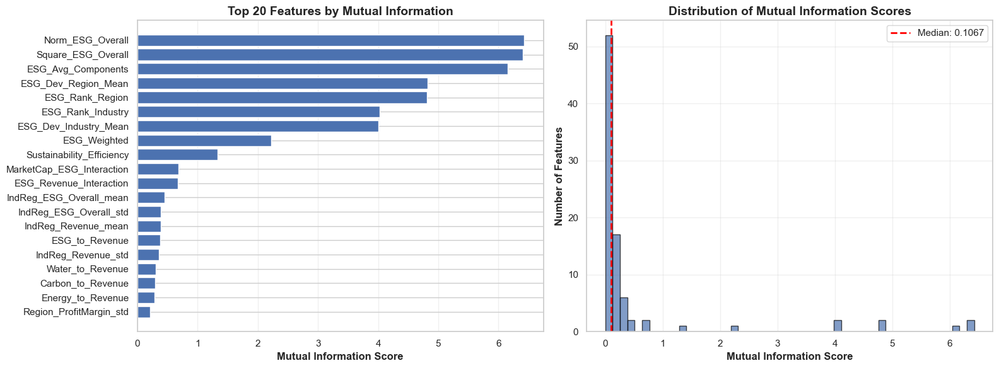


=== Selected Top 30 Features ===
Selected features: ['Norm_ESG_Overall', 'Square_ESG_Overall', 'ESG_Avg_Components', 'ESG_Dev_Region_Mean', 'ESG_Rank_Region', 'ESG_Rank_Industry', 'ESG_Dev_Industry_Mean', 'ESG_Weighted', 'Sustainability_Efficiency', 'MarketCap_ESG_Interaction', 'ESG_Revenue_Interaction', 'IndReg_ESG_Overall_mean', 'IndReg_ESG_Overall_std', 'IndReg_Revenue_mean', 'ESG_to_Revenue', 'IndReg_Revenue_std', 'Water_to_Revenue', 'Carbon_to_Revenue', 'Energy_to_Revenue', 'Region_ProfitMargin_std', 'Region_ESG_Overall_std', 'Region_ProfitMargin_mean', 'Region_Revenue_median', 'Region_Revenue_std', 'Region_ESG_Overall_median', 'ESG_Financial_Balance', 'Profit_ESG_Interaction', 'Region_ESG_Overall_mean', 'Region_Revenue_mean', 'Company_Count_Region']

Feature importance saved to 'feature_importance_mi.csv'


In [19]:
# Prepare data for feature selection
# We'll use ESG_Overall as our target variable for demonstration
df_fe_selection = df_fe.copy()

# Encode categorical variables for mutual information
le_dict = {}
categorical_cols = df_fe_selection.select_dtypes(include=['object', 'category']).columns.tolist()

for col in categorical_cols:
    le = LabelEncoder()
    df_fe_selection[col + '_encoded'] = le.fit_transform(df_fe_selection[col].astype(str))
    le_dict[col] = le

# Select features (exclude target and ID columns)
feature_cols = [col for col in df_fe_selection.columns 
                if col not in ['CompanyID', 'ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance',
                              'Year_Datetime'] and not col.endswith('_encoded')]

# Also exclude original categorical columns (we'll use encoded versions)
feature_cols = [col for col in feature_cols if col not in categorical_cols]

# Handle missing values
df_fe_selection[feature_cols] = df_fe_selection[feature_cols].fillna(df_fe_selection[feature_cols].median())

# Prepare target
target = df_fe_selection['ESG_Overall'].fillna(df_fe_selection['ESG_Overall'].median())

# Calculate Mutual Information scores
print("=== Feature Selection using Mutual Information ===")
print(f"Number of features to evaluate: {len(feature_cols)}")

mi_scores = mutual_info_regression(df_fe_selection[feature_cols], target, random_state=42)

# Create feature importance dataframe
feature_importance = pd.DataFrame({
    'Feature': feature_cols,
    'MI_Score': mi_scores
}).sort_values('MI_Score', ascending=False)

print(f"\nTop 20 Features by Mutual Information Score:")
display(feature_importance.head(20))

# Visualize top features
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Top 20 features
top_20 = feature_importance.head(20)
axes[0].barh(range(len(top_20)), top_20['MI_Score'].values)
axes[0].set_yticks(range(len(top_20)))
axes[0].set_yticklabels(top_20['Feature'].values)
axes[0].set_xlabel('Mutual Information Score', fontsize=12, fontweight='bold')
axes[0].set_title('Top 20 Features by Mutual Information', fontsize=14, fontweight='bold')
axes[0].invert_yaxis()
axes[0].grid(True, alpha=0.3, axis='x')

# Distribution of MI scores
axes[1].hist(mi_scores, bins=50, edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Mutual Information Score', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Features', fontsize=12, fontweight='bold')
axes[1].set_title('Distribution of Mutual Information Scores', fontsize=14, fontweight='bold')
axes[1].axvline(np.median(mi_scores), color='red', linestyle='--', linewidth=2, label=f'Median: {np.median(mi_scores):.4f}')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Select top features (e.g., top 30 or features above median)
top_n = 30
selected_features_mi = feature_importance.head(top_n)['Feature'].tolist()
print(f"\n=== Selected Top {top_n} Features ===")
print(f"Selected features: {selected_features_mi}")

# Save feature importance for later use
feature_importance.to_csv('feature_importance_mi.csv', index=False)
print(f"\nFeature importance saved to 'feature_importance_mi.csv'")


## Dimensionality Reduction using PCA

Principal Component Analysis (PCA) reduces the dimensionality of the data while preserving as much variance as possible. This helps with visualization, reduces overfitting, and can improve model performance.


=== Principal Component Analysis (PCA) ===
Original feature space: 88 dimensions
Number of samples: 10000

Variance explained:
  Components for 80% variance: 10 (80.41%)
  Components for 90% variance: 17 (90.66%)
  Components for 95% variance: 22 (95.18%)


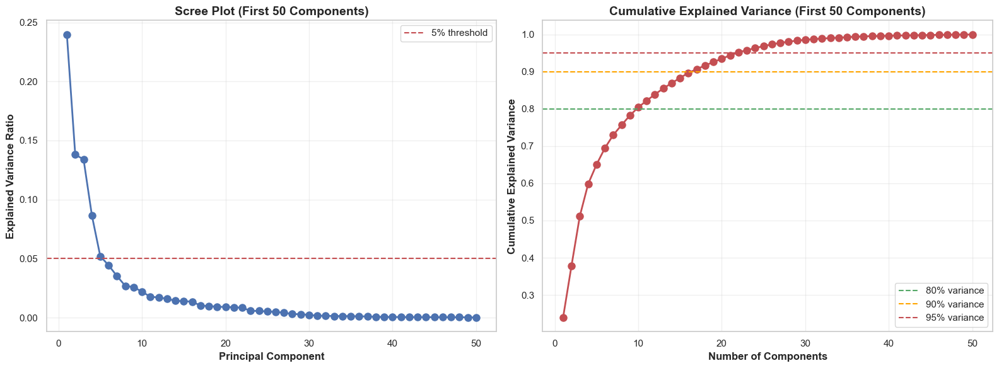


=== PCA Transformation ===
Selected components: 22
Variance explained: 95.18%
Reduced dimensions: 22 (from 88)
Compression ratio: 4.00x

PCA transformed dataset shape: (10000, 26)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,ESG_Overall,Industry,Region,Year
0,-4.122268,-6.690298,-0.466080,-0.438279,1.956302,-0.652780,-1.032658,0.843668,0.388633,0.115501,-1.100740,0.381947,-0.010124,-0.874700,-1.631178,1.609268,0.114346,-0.388037,0.558081,0.038544,-1.809405,-0.326291,56.7,Retail,Latin America,2016
1,-3.529213,-5.697369,0.028182,-0.714453,2.477863,-0.022063,-0.748291,0.803695,-0.136435,2.531192,-0.810859,0.313506,0.033248,-0.712645,-1.657536,1.445409,0.199850,-0.359754,0.675936,0.806982,-1.667083,-0.418236,56.5,Retail,Latin America,2017
2,-3.792845,-5.019204,1.245708,-0.804509,1.884925,-0.940716,-1.056242,0.793905,0.533773,-0.456181,-0.998766,0.448661,-0.047570,-0.714440,-1.608749,1.712606,0.034886,-0.505421,0.598087,0.516568,-1.691058,-0.557244,58.0,Retail,Latin America,2018
3,-3.548970,-4.277317,1.675810,-1.337985,1.663666,-0.759237,-0.819837,0.781045,0.453717,-0.460503,-1.094697,0.530957,0.097040,-0.910243,-1.729636,1.499073,0.017173,-0.651555,0.523937,0.001830,-1.719757,-0.393177,56.6,Retail,Latin America,2019
4,-3.251080,-2.759119,3.004053,-2.058707,1.517296,-0.639686,-0.544748,0.670530,0.330065,0.022550,-0.946494,0.504710,0.172930,-0.670362,-1.805740,1.560941,0.038190,-0.765773,-0.276502,-1.817599,-2.192089,-0.517891,55.7,Retail,Latin America,2020


In [20]:
# Prepare data for PCA
# Use the selected features from Mutual Information or all numerical features
df_pca = df_fe_selection[feature_cols].copy()

# Handle any remaining missing values
df_pca = df_pca.fillna(df_pca.median())

# Standardize features (important for PCA)
scaler_pca = StandardScaler()
df_pca_scaled = scaler_pca.fit_transform(df_pca)

print("=== Principal Component Analysis (PCA) ===")
print(f"Original feature space: {df_pca_scaled.shape[1]} dimensions")
print(f"Number of samples: {df_pca_scaled.shape[0]}")

# Fit PCA
# First, let's see how many components explain 95% of variance
pca_full = PCA()
pca_full.fit(df_pca_scaled)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# Find number of components for 95% variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
n_components_80 = np.argmax(cumulative_variance >= 0.80) + 1

print(f"\nVariance explained:")
print(f"  Components for 80% variance: {n_components_80} ({cumulative_variance[n_components_80-1]:.2%})")
print(f"  Components for 90% variance: {n_components_90} ({cumulative_variance[n_components_90-1]:.2%})")
print(f"  Components for 95% variance: {n_components_95} ({cumulative_variance[n_components_95-1]:.2%})")

# Visualize explained variance
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scree plot (first 50 components)
n_plot = min(50, len(pca_full.explained_variance_ratio_))
axes[0].plot(range(1, n_plot + 1), pca_full.explained_variance_ratio_[:n_plot], 'bo-', linewidth=2, markersize=8)
axes[0].set_xlabel('Principal Component', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Explained Variance Ratio', fontsize=12, fontweight='bold')
axes[0].set_title(f'Scree Plot (First {n_plot} Components)', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].axhline(y=0.05, color='r', linestyle='--', label='5% threshold')
axes[0].legend()

# Cumulative explained variance
axes[1].plot(range(1, n_plot + 1), cumulative_variance[:n_plot], 'ro-', linewidth=2, markersize=8)
axes[1].axhline(y=0.80, color='g', linestyle='--', label='80% variance')
axes[1].axhline(y=0.90, color='orange', linestyle='--', label='90% variance')
axes[1].axhline(y=0.95, color='r', linestyle='--', label='95% variance')
axes[1].set_xlabel('Number of Components', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Cumulative Explained Variance', fontsize=12, fontweight='bold')
axes[1].set_title(f'Cumulative Explained Variance (First {n_plot} Components)', fontsize=14, fontweight='bold')
axes[1].grid(True, alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()

# Apply PCA with selected number of components
n_components_selected = n_components_95  # Use 95% variance
pca = PCA(n_components=n_components_selected)
df_pca_transformed = pca.fit_transform(df_pca_scaled)

print(f"\n=== PCA Transformation ===")
print(f"Selected components: {n_components_selected}")
print(f"Variance explained: {pca.explained_variance_ratio_.sum():.2%}")
print(f"Reduced dimensions: {df_pca_transformed.shape[1]} (from {df_pca_scaled.shape[1]})")
print(f"Compression ratio: {df_pca_scaled.shape[1] / df_pca_transformed.shape[1]:.2f}x")

# Create dataframe with principal components
pca_df = pd.DataFrame(df_pca_transformed, 
                     columns=[f'PC{i+1}' for i in range(n_components_selected)])

# Add back target and other important columns for analysis
pca_df['ESG_Overall'] = target.values
pca_df['Industry'] = df_fe_selection['Industry'].values
pca_df['Region'] = df_fe_selection['Region'].values
pca_df['Year'] = df_fe_selection['Year'].values

print(f"\nPCA transformed dataset shape: {pca_df.shape}")
display(pca_df.head())


=== Principal Component Analysis ===

Top 10 features contributing to first 5 principal components:

PC1 (Explained Variance: 23.97%):


,Feature,Loading
25,Sqrt_MarketCap,0.189363
31,MarketCap_ESG_Interaction,0.189338
29,ESG_Revenue_Interaction,0.184765
3,MarketCap,0.184236
24,Sqrt_Revenue,0.181885
73,IndReg_Revenue_mean,0.180197
57,Industry_MarketCap_mean,0.180087
47,Industry_Revenue_mean,0.179773
33,Norm_Revenue,0.177476
1,Revenue,0.177476



PC2 (Explained Variance: 13.81%):


,Feature,Loading
22,Log_CarbonEmissions,0.201721
0,Year,0.197818
46,Year_Trend,0.197818
43,Years_Since_2015,0.197818
41,Year_Sin,0.197817
69,Year_ESG_Overall_mean,0.197760
23,Log_EnergyConsumption,0.197726
67,Year_Revenue_mean,0.197210
72,Year_ProfitMargin_std,0.197171
36,Env_Impact_Score,0.196759



PC3 (Explained Variance: 13.40%):


,Feature,Loading
0,Year,0.195372
43,Years_Since_2015,0.195372
46,Year_Trend,0.195372
41,Year_Sin,0.195372
69,Year_ESG_Overall_mean,0.195317
67,Year_Revenue_mean,0.194757
72,Year_ProfitMargin_std,0.194738
68,Year_Revenue_std,0.194146
39,Sustainability_Efficiency,0.193611
42,Year_Cos,0.190952



PC4 (Explained Variance: 8.63%):


,Feature,Loading
85,ESG_Dev_Industry_Mean,0.275445
81,ESG_Rank_Industry,0.273353
62,Region_ESG_Overall_mean,0.236852
64,Region_ESG_Overall_median,0.236531
34,ESG_Avg_Components,0.215719
32,Norm_ESG_Overall,0.215717
26,Square_ESG_Overall,0.212806
35,ESG_Weighted,0.189518
23,Log_EnergyConsumption,0.158353
40,Profit_per_ESG,-0.152721



PC5 (Explained Variance: 5.20%):


,Feature,Loading
84,Revenue_Dev_Industry_Mean,0.270539
80,Revenue_Rank_Industry,0.252123
27,Square_ProfitMargin,-0.245342
2,ProfitMargin,-0.235228
38,ESG_Financial_Balance,-0.213319
30,Profit_ESG_Interaction,-0.213319
14,Energy_to_Revenue,-0.201008
40,Profit_per_ESG,-0.200512
9,MarketCap_to_Revenue,-0.187315
11,ESG_to_Profit,0.185363


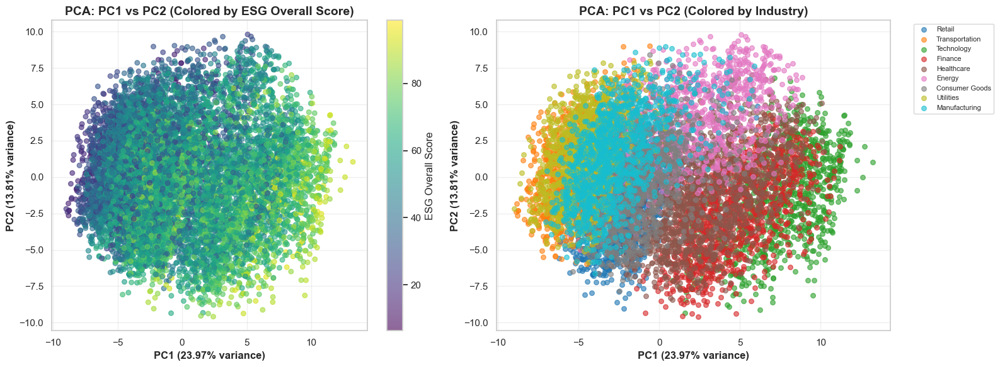


=== Correlation between Principal Components and ESG_Overall ===


,PC,Correlation,Variance_Explained
3,PC4,0.591215,0.086338
2,PC3,0.549697,0.133997
0,PC1,0.468452,0.239744
1,PC2,-0.292354,0.138056
6,PC7,-0.175455,0.035159
7,PC8,0.064348,0.026836
4,PC5,-0.021878,0.051983
5,PC6,0.020744,0.044281
8,PC9,0.009267,0.025839
9,PC10,0.007226,0.021871


In [21]:
# Analyze principal components
print("=== Principal Component Analysis ===")

# Component loadings (how original features contribute to each PC)
print("\nTop 10 features contributing to first 5 principal components:")
for i in range(min(5, n_components_selected)):
    component_loadings = pd.DataFrame({
        'Feature': feature_cols,
        'Loading': pca.components_[i]
    }).sort_values('Loading', key=abs, ascending=False)
    
    print(f"\nPC{i+1} (Explained Variance: {pca.explained_variance_ratio_[i]:.2%}):")
    display(component_loadings.head(10))

# Visualize first 2 principal components
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# PC1 vs PC2 colored by ESG_Overall
scatter1 = axes[0].scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['ESG_Overall'], 
                          cmap='viridis', alpha=0.6, s=30)
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)', fontsize=12, fontweight='bold')
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)', fontsize=12, fontweight='bold')
axes[0].set_title('PCA: PC1 vs PC2 (Colored by ESG Overall Score)', fontsize=14, fontweight='bold')
plt.colorbar(scatter1, ax=axes[0], label='ESG Overall Score')
axes[0].grid(True, alpha=0.3)

# PC1 vs PC2 colored by Industry
unique_industries = pca_df['Industry'].unique()
colors_industry = plt.cm.tab10(np.linspace(0, 1, len(unique_industries)))
for i, industry in enumerate(unique_industries):
    mask = pca_df['Industry'] == industry
    axes[1].scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'], 
                   c=[colors_industry[i]], label=industry, alpha=0.6, s=30)
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)', fontsize=12, fontweight='bold')
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)', fontsize=12, fontweight='bold')
axes[1].set_title('PCA: PC1 vs PC2 (Colored by Industry)', fontsize=14, fontweight='bold')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Interactive 3D PCA visualization using Plotly
fig_3d = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', 
                       color='ESG_Overall',
                       hover_data=['Industry', 'Region', 'Year'],
                       title='Interactive 3D PCA Visualization (PC1, PC2, PC3)',
                       labels={'PC1': f'PC1 ({pca.explained_variance_ratio_[0]:.2%})',
                              'PC2': f'PC2 ({pca.explained_variance_ratio_[1]:.2%})',
                              'PC3': f'PC3 ({pca.explained_variance_ratio_[2]:.2%})'})
fig_3d.update_layout(font_size=12, title_font_size=16, height=700)
fig_3d.show()

# Correlation between principal components and target
print("\n=== Correlation between Principal Components and ESG_Overall ===")
pc_correlations = []
for i in range(min(10, n_components_selected)):
    corr = np.corrcoef(pca_df[f'PC{i+1}'], pca_df['ESG_Overall'])[0, 1]
    pc_correlations.append({'PC': f'PC{i+1}', 'Correlation': corr, 
                           'Variance_Explained': pca.explained_variance_ratio_[i]})

pc_corr_df = pd.DataFrame(pc_correlations)
display(pc_corr_df.sort_values('Correlation', key=abs, ascending=False))


## Feature Engineering Summary

### Summary of Feature Engineering Process

1. **Ratio Features**: Created 15+ ratio features comparing financial metrics, ESG scores, and environmental impacts
2. **Binning Features**: Converted 7 continuous variables into categorical bins for better pattern recognition
3. **Mathematical Functions**: Applied logarithmic, square root, polynomial, and interaction transformations
4. **Feature Combinations**: Created composite scores and combined multiple features to capture complex relationships
5. **Date/Time Transformations**: Extracted temporal patterns from the Year column using cyclical encoding and period categorization
6. **Aggregation Statistics**: Generated group-level statistics (mean, std, median) for Industry, Region, Year, and their combinations
7. **Feature Selection**: Used Mutual Information to identify the most informative features
8. **Dimensionality Reduction**: Applied PCA to reduce feature space while preserving 95% of variance

### Key Benefits

- **Improved Model Performance**: Engineered features can capture non-linear relationships and interactions
- **Reduced Dimensionality**: PCA reduces computational complexity while maintaining information
- **Better Interpretability**: Feature selection helps identify the most important variables
- **Handling Non-linearity**: Mathematical transformations and binning help models capture complex patterns


## Preprocessing: Convert All Features to Numerical

### 1. One-Hot Encoding for Categorical Variables


In [22]:
# Create a copy for preprocessing
df_processed = df.copy()

# Identify categorical columns
categorical_cols = df_processed.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"Categorical columns to encode: {categorical_cols}")

# One-hot encode categorical variables
if categorical_cols:
    df_encoded = pd.get_dummies(df_processed, columns=categorical_cols, prefix=categorical_cols, drop_first=False)
    print(f"\nShape before encoding: {df_processed.shape}")
    print(f"Shape after encoding: {df_encoded.shape}")
    print(f"\nNew columns created: {df_encoded.shape[1] - df_processed.shape[1]}")
    
    # Display first few rows
    display(df_encoded.head())
    
    # Update df_processed
    df_processed = df_encoded
else:
    print("No categorical columns to encode.")
    df_processed = df.copy()

print("\n=== All features are now numerical ===")
print(f"Data types:\n{df_processed.dtypes.value_counts()}")


Categorical columns to encode: ['CompanyName', 'Industry', 'Region']

Shape before encoding: (10000, 16)
Shape after encoding: (10000, 1029)

New columns created: 1013


,CompanyID,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption,CompanyName_Company_1,CompanyName_Company_10,CompanyName_Company_100,CompanyName_Company_1000,CompanyName_Company_101,CompanyName_Company_102,CompanyName_Company_103,CompanyName_Company_104,CompanyName_Company_105,CompanyName_Company_106,CompanyName_Company_107,CompanyName_Company_108,CompanyName_Company_109,CompanyName_Company_11,CompanyName_Company_110,CompanyName_Company_111,CompanyName_Company_112,CompanyName_Company_113,CompanyName_Company_114,CompanyName_Company_115,CompanyName_Company_116,CompanyName_Company_117,CompanyName_Company_118,CompanyName_Company_119,CompanyName_Company_12,CompanyName_Company_120,CompanyName_Company_121,CompanyName_Company_122,CompanyName_Company_123,CompanyName_Company_124,CompanyName_Company_125,CompanyName_Company_126,CompanyName_Company_127,CompanyName_Company_128,CompanyName_Company_129,CompanyName_Company_13,CompanyName_Company_130,CompanyName_Company_131,CompanyName_Company_132,CompanyName_Company_133,CompanyName_Company_134,CompanyName_Company_135,CompanyName_Company_136,CompanyName_Company_137,CompanyName_Company_138,CompanyName_Company_139,CompanyName_Company_14,CompanyName_Company_140,CompanyName_Company_141,CompanyName_Company_142,CompanyName_Company_143,CompanyName_Company_144,CompanyName_Company_145,CompanyName_Company_146,CompanyName_Company_147,CompanyName_Company_148,CompanyName_Company_149,CompanyName_Company_15,CompanyName_Company_150,CompanyName_Company_151,CompanyName_Company_152,CompanyName_Company_153,CompanyName_Company_154,CompanyName_Company_155,CompanyName_Company_156,CompanyName_Company_157,CompanyName_Company_158,CompanyName_Company_159,CompanyName_Company_16,CompanyName_Company_160,CompanyName_Company_161,CompanyName_Company_162,CompanyName_Company_163,CompanyName_Company_164,CompanyName_Company_165,CompanyName_Company_166,CompanyName_Company_167,CompanyName_Company_168,CompanyName_Company_169,CompanyName_Company_17,CompanyName_Company_170,CompanyName_Company_171,CompanyName_Company_172,CompanyName_Company_173,CompanyName_Company_174,CompanyName_Company_175,CompanyName_Company_176,...,CompanyName_Company_923,CompanyName_Company_924,CompanyName_Company_925,CompanyName_Company_926,CompanyName_Company_927,CompanyName_Company_928,CompanyName_Company_929,CompanyName_Company_93,CompanyName_Company_930,CompanyName_Company_931,CompanyName_Company_932,CompanyName_Company_933,CompanyName_Company_934,CompanyName_Company_935,CompanyName_Company_936,CompanyName_Company_937,CompanyName_Company_938,CompanyName_Company_939,CompanyName_Company_94,CompanyName_Company_940,CompanyName_Company_941,CompanyName_Company_942,CompanyName_Company_943,CompanyName_Company_944,CompanyName_Company_945,CompanyName_Company_946,CompanyName_Company_947,CompanyName_Company_948,CompanyName_Company_949,CompanyName_Company_95,CompanyName_Company_950,CompanyName_Company_951,CompanyName_Company_952,CompanyName_Company_953,CompanyName_Company_954,CompanyName_Company_955,CompanyName_Company_956,CompanyName_Company_957,CompanyName_Company_958,CompanyName_Company_959,CompanyName_Company_96,CompanyName_Company_960,CompanyName_Company_961,CompanyName_Company_962,CompanyName_Company_963,CompanyName_Company_964,CompanyName_Company_965,CompanyName_Company_966,CompanyName_Company_967,CompanyName_Company_968,CompanyName_Company_969,CompanyName_Company_97,CompanyName_Company_970,CompanyName_Company_971,CompanyName_Company_972,CompanyName_Company_973,CompanyName_Company_974,CompanyName_Company_975,CompanyName_Company_976,CompanyName_Company_977,CompanyName_Company_978,CompanyName_Company_979,CompanyName_Company_98,CompanyName_Company_980,CompanyName_Company_981,CompanyName_Company_982,CompanyName_Company_983,CompanyName_Company_984,CompanyName_Company_985,CompanyName_Company_986,CompanyName_Company_987,CompanyName_Company_988,CompanyName_Company_989,CompanyName_


=== All features are now numerical ===
Data types:
bool       1016
float64      11
int64         2
Name: count, dtype: int64


### 2. Normalization/Standardization

We'll create both normalized (Min-Max scaling) and standardized (Z-score) versions of numerical features.


In [23]:
# Identify numerical columns to scale (exclude ID and one-hot encoded columns)
numerical_cols_to_scale = ['Year', 'Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate',
                           'ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance',
                           'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']

# Filter to only include columns that exist
numerical_cols_to_scale = [col for col in numerical_cols_to_scale if col in df_processed.columns]

print(f"Columns to normalize/standardize: {numerical_cols_to_scale}")

# Create copies for different scaling methods
df_normalized = df_processed.copy()
df_standardized = df_processed.copy()

# Min-Max Normalization (0-1 range)
min_max_scaler = MinMaxScaler()
df_normalized[numerical_cols_to_scale] = min_max_scaler.fit_transform(df_processed[numerical_cols_to_scale])

# Standardization (Z-score: mean=0, std=1)
standard_scaler = StandardScaler()
df_standardized[numerical_cols_to_scale] = standard_scaler.fit_transform(df_processed[numerical_cols_to_scale])

# Display comparison
print("\n=== Normalization Comparison ===")
print("\nOriginal data (sample):")
display(df_processed[numerical_cols_to_scale[:5]].head())

print("\nMin-Max Normalized (0-1 range):")
display(df_normalized[numerical_cols_to_scale[:5]].head())

print("\nStandardized (Z-score):")
display(df_standardized[numerical_cols_to_scale[:5]].head())

# Statistics comparison
print("\n=== Statistics Comparison ===")
comparison_stats = pd.DataFrame({
    'Original_Mean': df_processed[numerical_cols_to_scale].mean(),
    'Normalized_Mean': df_normalized[numerical_cols_to_scale].mean(),
    'Standardized_Mean': df_standardized[numerical_cols_to_scale].mean(),
    'Original_Std': df_processed[numerical_cols_to_scale].std(),
    'Normalized_Std': df_normalized[numerical_cols_to_scale].std(),
    'Standardized_Std': df_standardized[numerical_cols_to_scale].std()
})
display(comparison_stats.round(3))

# Use standardized version for further analysis (common practice)
df_final = df_standardized.copy()
print(f"\n=== Using standardized data for analysis ===")
print(f"Final dataset shape: {df_final.shape}")


Columns to normalize/standardize: ['Year', 'Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate', 'ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance', 'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']

=== Normalization Comparison ===

Original data (sample):


,Year,Revenue,ProfitMargin,MarketCap,GrowthRate
1,2016,473.8,4.6,366.6,3.2
2,2017,564.9,5.2,313.4,19.2
3,2018,558.4,4.3,283.0,-1.1
4,2019,554.5,4.9,538.1,-0.7
5,2020,567.5,6.0,384.1,2.3



Min-Max Normalized (0-1 range):


,Year,Revenue,ProfitMargin,MarketCap,GrowthRate
1,0.000000,0.045254,0.361607,0.015060,0.466785
2,0.111111,0.054668,0.375000,0.012864,0.791329
3,0.222222,0.053997,0.354911,0.011609,0.379564
4,0.333333,0.053594,0.368304,0.022140,0.387677
5,0.444444,0.054937,0.392857,0.015783,0.448529



Standardized (Z-score):


,Year,Revenue,ProfitMargin,MarketCap,GrowthRate
1,-1.566699,-0.905535,-0.725164,-0.828069,-0.176586
2,-1.218544,-0.875606,-0.655988,-0.834614,1.543202
3,-0.870388,-0.877742,-0.759752,-0.838354,-0.638779
4,-0.522233,-0.879023,-0.690576,-0.806971,-0.595784
5,-0.174078,-0.874752,-0.563754,-0.825916,-0.273324



=== Statistics Comparison ===


,Original_Mean,Normalized_Mean,Standardized_Mean,Original_Std,Normalized_Std,Standardized_Std
Year,2020.500,0.500,0.0,2.872,0.319,1.0
Revenue,3230.137,0.330,-0.0,3044.029,0.315,1.0
ProfitMargin,10.890,0.502,-0.0,8.674,0.194,1.0
MarketCap,7097.793,0.293,-0.0,8129.188,0.336,1.0
GrowthRate,4.843,0.500,-0.0,9.304,0.189,1.0
ESG_Overall,54.933,0.526,0.0,15.870,0.172,1.0
ESG_Environmental,56.868,0.569,0.0,26.703,0.267,1.0
ESG_Social,55.913,0.559,-0.0,23.363,0.234,1.0
ESG_Governance,52.016,0.520,-0.0,25.323,0.253,1.0
CarbonEmissions,530171.115,0.313,0.0,541213.564,0.321,1.0



=== Using standardized data for analysis ===
Final dataset shape: (10000, 1029)


## Data Visualization

### 1. Pie Charts


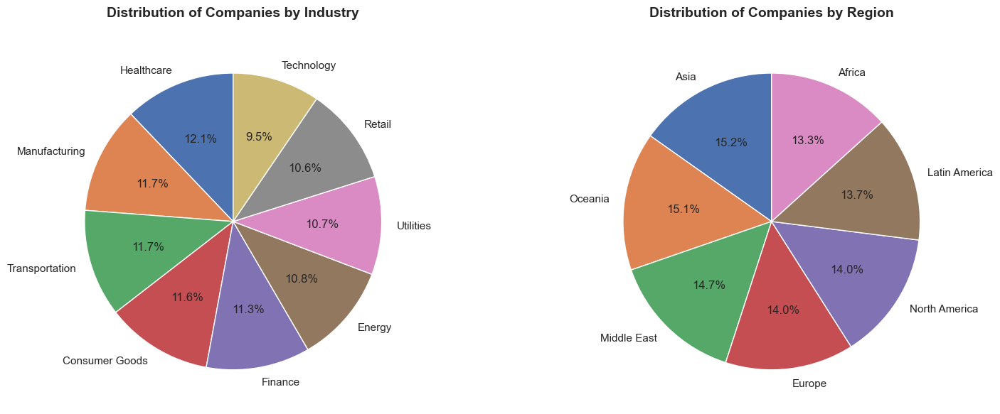

In [24]:
# Pie Chart 1: Industry Distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Industry distribution
industry_counts = df['Industry'].value_counts()
axes[0].pie(industry_counts.values, labels=industry_counts.index, autopct='%1.1f%%', startangle=90)
axes[0].set_title('Distribution of Companies by Industry', fontsize=14, fontweight='bold', pad=20)

# Region distribution
region_counts = df['Region'].value_counts()
axes[1].pie(region_counts.values, labels=region_counts.index, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Distribution of Companies by Region', fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

# Interactive Pie Chart using Plotly
fig_pie = px.pie(df, names='Industry', title='Interactive Industry Distribution',
                 hole=0.4)  # Creates a donut chart
fig_pie.update_traces(textposition='inside', textinfo='percent+label')
fig_pie.update_layout(font_size=12, title_font_size=16)
fig_pie.show()


### 2. Box Plots


C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3855162658.py:33: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

C:\Users\Asus\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



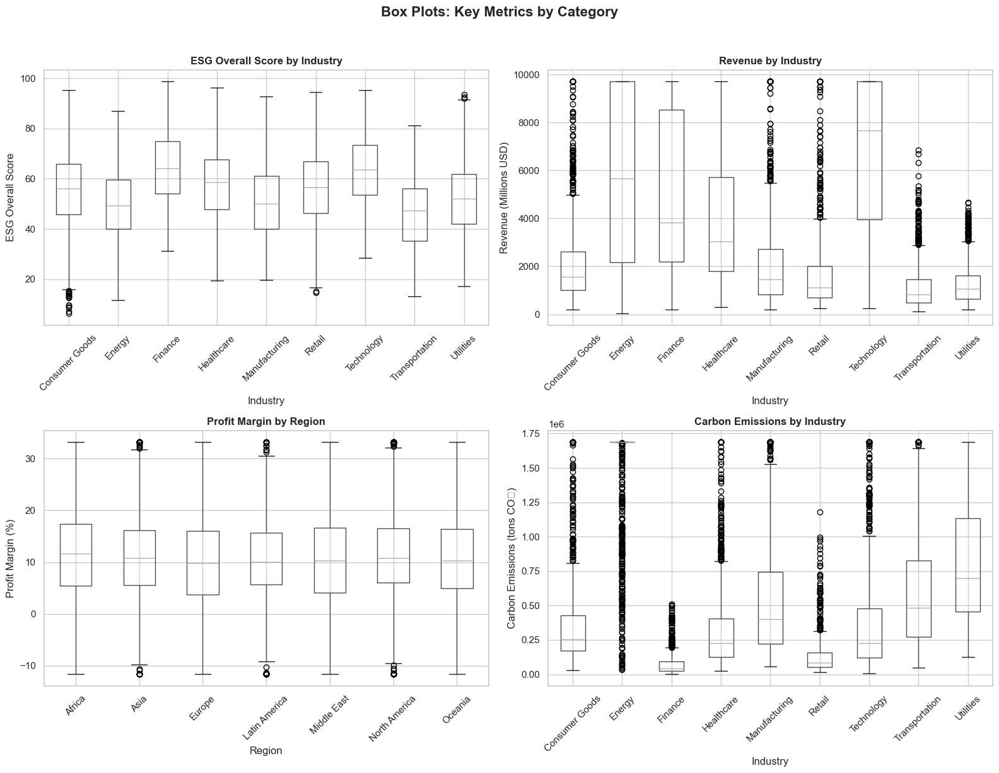

In [25]:
# Box Plot 1: ESG Scores by Industry
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# ESG Overall by Industry
df.boxplot(column='ESG_Overall', by='Industry', ax=axes[0, 0])
axes[0, 0].set_title('ESG Overall Score by Industry', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Industry')
axes[0, 0].set_ylabel('ESG Overall Score')
axes[0, 0].tick_params(axis='x', rotation=45)

# Revenue by Industry
df.boxplot(column='Revenue', by='Industry', ax=axes[0, 1])
axes[0, 1].set_title('Revenue by Industry', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Industry')
axes[0, 1].set_ylabel('Revenue (Millions USD)')
axes[0, 1].tick_params(axis='x', rotation=45)

# Profit Margin by Region
df.boxplot(column='ProfitMargin', by='Region', ax=axes[1, 0])
axes[1, 0].set_title('Profit Margin by Region', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Region')
axes[1, 0].set_ylabel('Profit Margin (%)')
axes[1, 0].tick_params(axis='x', rotation=45)

# Carbon Emissions by Industry
df.boxplot(column='CarbonEmissions', by='Industry', ax=axes[1, 1])
axes[1, 1].set_title('Carbon Emissions by Industry', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Industry')
axes[1, 1].set_ylabel('Carbon Emissions (tons CO₂)')
axes[1, 1].tick_params(axis='x', rotation=45)

plt.suptitle('Box Plots: Key Metrics by Category', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Interactive Box Plot using Plotly
fig_box = px.box(df, x='Industry', y='ESG_Overall', color='Region',
                 title='Interactive Box Plot: ESG Overall Score by Industry and Region',
                 labels={'ESG_Overall': 'ESG Overall Score', 'Industry': 'Industry'})
fig_box.update_layout(font_size=12, title_font_size=16, height=600)
fig_box.update_xaxes(tickangle=45)
fig_box.show()


### 3. Line Charts and Multi-line Charts


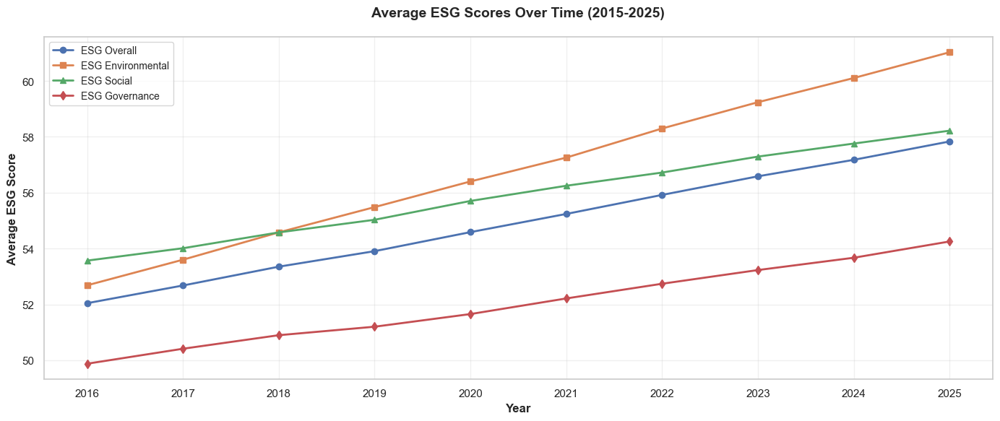

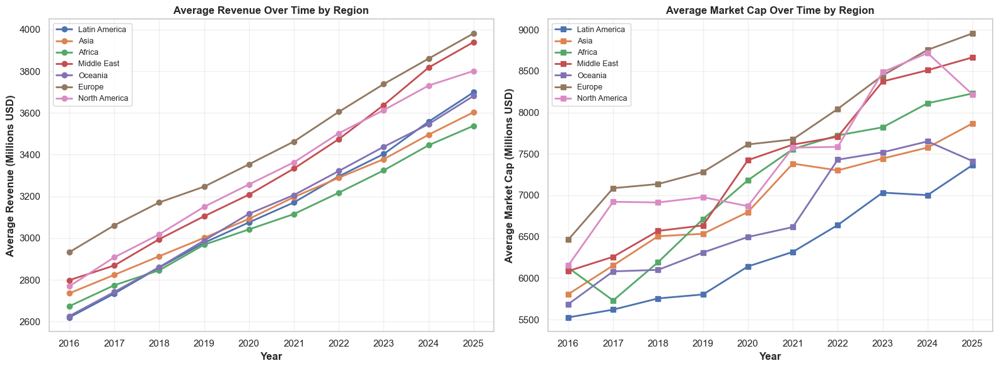

In [26]:
# Line Chart 1: Average ESG Scores Over Time
yearly_esg = df.groupby('Year').agg({
    'ESG_Overall': 'mean',
    'ESG_Environmental': 'mean',
    'ESG_Social': 'mean',
    'ESG_Governance': 'mean'
}).reset_index()

plt.figure(figsize=(14, 6))
plt.plot(yearly_esg['Year'], yearly_esg['ESG_Overall'], marker='o', label='ESG Overall', linewidth=2)
plt.plot(yearly_esg['Year'], yearly_esg['ESG_Environmental'], marker='s', label='ESG Environmental', linewidth=2)
plt.plot(yearly_esg['Year'], yearly_esg['ESG_Social'], marker='^', label='ESG Social', linewidth=2)
plt.plot(yearly_esg['Year'], yearly_esg['ESG_Governance'], marker='d', label='ESG Governance', linewidth=2)
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Average ESG Score', fontsize=12, fontweight='bold')
plt.title('Average ESG Scores Over Time (2015-2025)', fontsize=14, fontweight='bold', pad=20)
plt.legend(loc='best', fontsize=10)
plt.grid(True, alpha=0.3)
plt.xticks(yearly_esg['Year'])
plt.tight_layout()
plt.show()

# Multi-line Chart: Revenue and Market Cap Over Time by Region
yearly_region = df.groupby(['Year', 'Region']).agg({
    'Revenue': 'mean',
    'MarketCap': 'mean'
}).reset_index()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Revenue by Region over Time
for region in df['Region'].unique():
    region_data = yearly_region[yearly_region['Region'] == region]
    axes[0].plot(region_data['Year'], region_data['Revenue'], marker='o', label=region, linewidth=2)
axes[0].set_xlabel('Year', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Average Revenue (Millions USD)', fontsize=12, fontweight='bold')
axes[0].set_title('Average Revenue Over Time by Region', fontsize=12, fontweight='bold')
axes[0].legend(loc='best', fontsize=9)
axes[0].grid(True, alpha=0.3)
axes[0].set_xticks(yearly_region['Year'].unique())

# Market Cap by Region over Time
for region in df['Region'].unique():
    region_data = yearly_region[yearly_region['Region'] == region]
    axes[1].plot(region_data['Year'], region_data['MarketCap'], marker='s', label=region, linewidth=2)
axes[1].set_xlabel('Year', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Average Market Cap (Millions USD)', fontsize=12, fontweight='bold')
axes[1].set_title('Average Market Cap Over Time by Region', fontsize=12, fontweight='bold')
axes[1].legend(loc='best', fontsize=9)
axes[1].grid(True, alpha=0.3)
axes[1].set_xticks(yearly_region['Year'].unique())

plt.tight_layout()
plt.show()

# Interactive Multi-line Chart using Plotly
fig_line = px.line(yearly_esg, x='Year', y=['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance'],
                   title='Interactive Multi-line Chart: ESG Scores Over Time',
                   labels={'value': 'ESG Score', 'Year': 'Year', 'variable': 'ESG Component'})
fig_line.update_layout(font_size=12, title_font_size=16, height=500, legend_title_text='ESG Component')
fig_line.show()


### 4. Bar Charts (Grouped and Stacked)


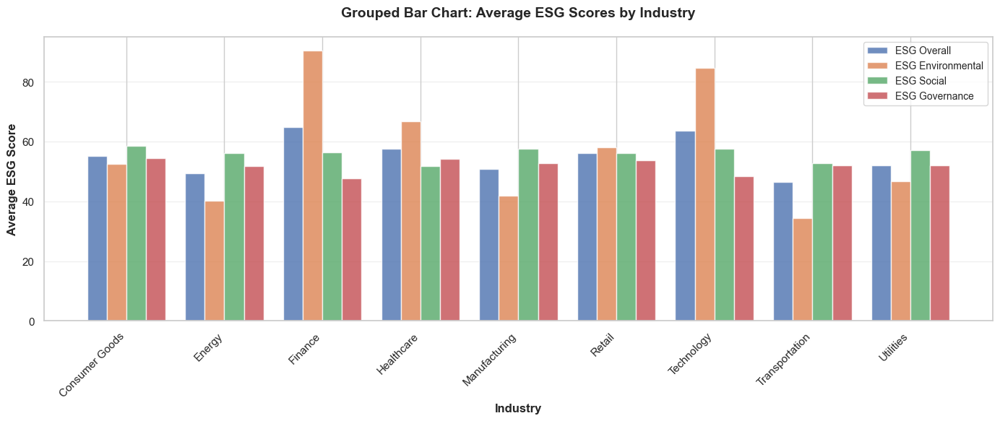

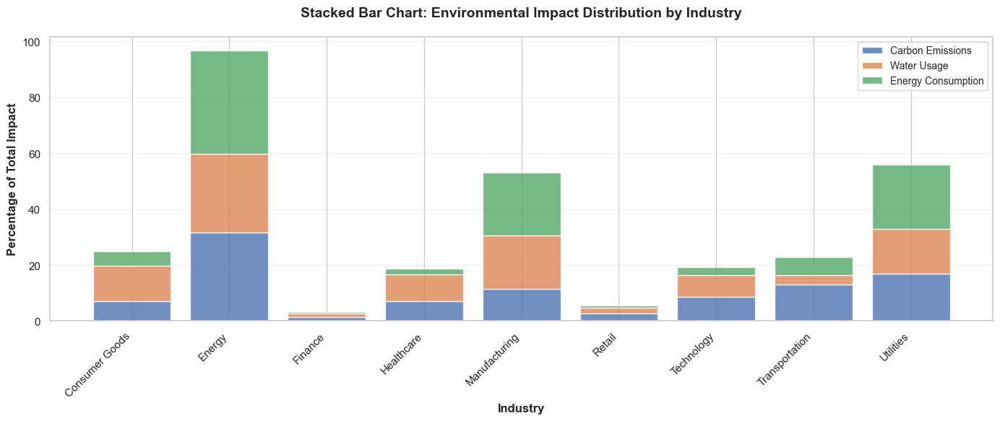

In [27]:
# Grouped Bar Chart: Average ESG Scores by Industry
industry_esg = df.groupby('Industry').agg({
    'ESG_Overall': 'mean',
    'ESG_Environmental': 'mean',
    'ESG_Social': 'mean',
    'ESG_Governance': 'mean'
}).reset_index()

x = np.arange(len(industry_esg['Industry']))
width = 0.2

fig, ax = plt.subplots(figsize=(14, 6))
ax.bar(x - 1.5*width, industry_esg['ESG_Overall'], width, label='ESG Overall', alpha=0.8)
ax.bar(x - 0.5*width, industry_esg['ESG_Environmental'], width, label='ESG Environmental', alpha=0.8)
ax.bar(x + 0.5*width, industry_esg['ESG_Social'], width, label='ESG Social', alpha=0.8)
ax.bar(x + 1.5*width, industry_esg['ESG_Governance'], width, label='ESG Governance', alpha=0.8)

ax.set_xlabel('Industry', fontsize=12, fontweight='bold')
ax.set_ylabel('Average ESG Score', fontsize=12, fontweight='bold')
ax.set_title('Grouped Bar Chart: Average ESG Scores by Industry', fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(industry_esg['Industry'], rotation=45, ha='right')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Stacked Bar Chart: Environmental Impact by Industry
industry_env = df.groupby('Industry').agg({
    'CarbonEmissions': 'mean',
    'WaterUsage': 'mean',
    'EnergyConsumption': 'mean'
}).reset_index()

# Normalize for better visualization (convert to percentages)
industry_env_normalized = industry_env.copy()
for col in ['CarbonEmissions', 'WaterUsage', 'EnergyConsumption']:
    total = industry_env[col].sum()
    industry_env_normalized[col] = (industry_env[col] / total) * 100

fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(len(industry_env_normalized['Industry']))
ax.bar(x, industry_env_normalized['CarbonEmissions'], label='Carbon Emissions', alpha=0.8)
ax.bar(x, industry_env_normalized['WaterUsage'], bottom=industry_env_normalized['CarbonEmissions'],
       label='Water Usage', alpha=0.8)
ax.bar(x, industry_env_normalized['EnergyConsumption'],
       bottom=industry_env_normalized['CarbonEmissions'] + industry_env_normalized['WaterUsage'],
       label='Energy Consumption', alpha=0.8)

ax.set_xlabel('Industry', fontsize=12, fontweight='bold')
ax.set_ylabel('Percentage of Total Impact', fontsize=12, fontweight='bold')
ax.set_title('Stacked Bar Chart: Environmental Impact Distribution by Industry', fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(industry_env_normalized['Industry'], rotation=45, ha='right')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Interactive Grouped Bar Chart using Plotly
fig_bar = px.bar(industry_esg, x='Industry', y=['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance'],
                 title='Interactive Grouped Bar Chart: ESG Scores by Industry',
                 labels={'value': 'Average ESG Score', 'Industry': 'Industry', 'variable': 'ESG Component'},
                 barmode='group')
fig_bar.update_layout(font_size=12, title_font_size=16, height=500, xaxis_tickangle=-45)
fig_bar.show()


### 5. Scatter Plots and Bubble Charts


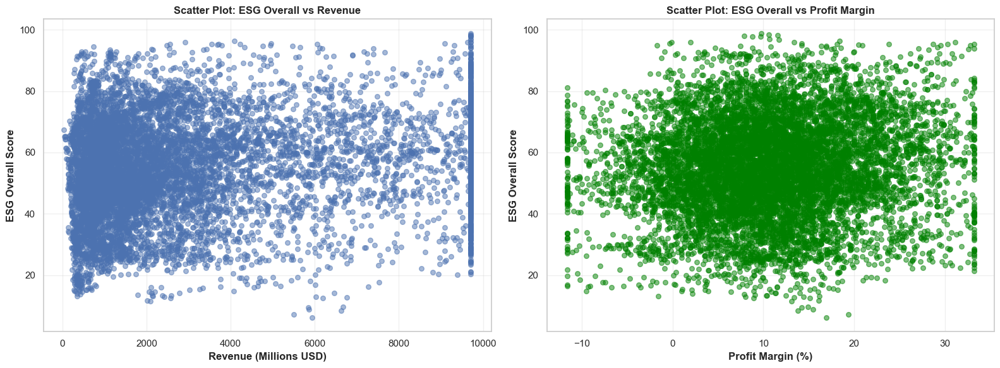

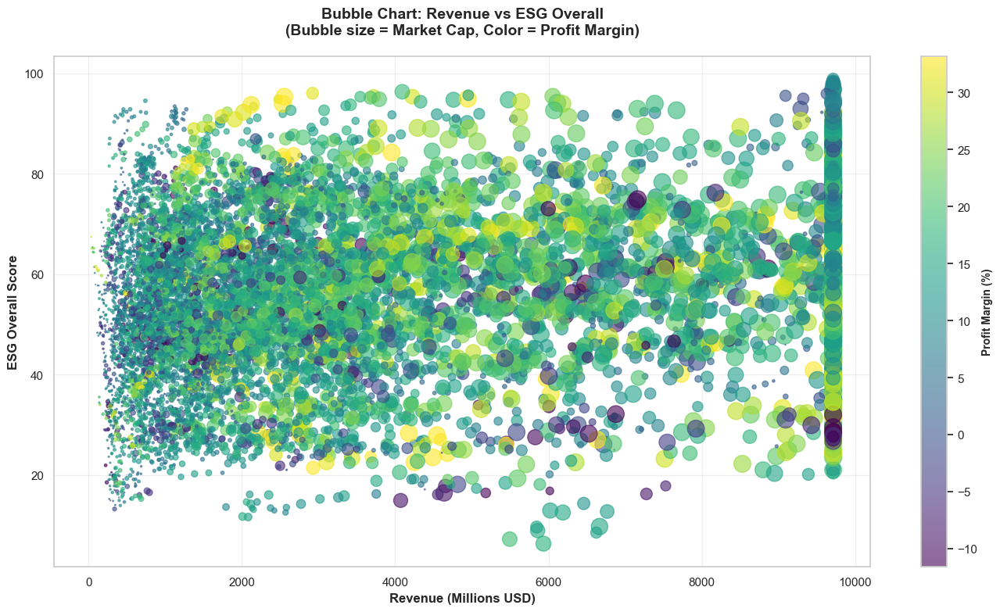

In [28]:
# Scatter Plot 1: ESG vs Financial Performance
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ESG Overall vs Revenue
axes[0].scatter(df['Revenue'], df['ESG_Overall'], alpha=0.5, s=30)
axes[0].set_xlabel('Revenue (Millions USD)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('ESG Overall Score', fontsize=12, fontweight='bold')
axes[0].set_title('Scatter Plot: ESG Overall vs Revenue', fontsize=12, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# ESG Overall vs Profit Margin
axes[1].scatter(df['ProfitMargin'], df['ESG_Overall'], alpha=0.5, s=30, c='green')
axes[1].set_xlabel('Profit Margin (%)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('ESG Overall Score', fontsize=12, fontweight='bold')
axes[1].set_title('Scatter Plot: ESG Overall vs Profit Margin', fontsize=12, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Bubble Chart: Revenue vs ESG with Market Cap as bubble size
fig, ax = plt.subplots(figsize=(14, 8))
scatter = ax.scatter(df['Revenue'], df['ESG_Overall'], s=df['MarketCap']/100, 
                     c=df['ProfitMargin'], alpha=0.6, cmap='viridis')
ax.set_xlabel('Revenue (Millions USD)', fontsize=12, fontweight='bold')
ax.set_ylabel('ESG Overall Score', fontsize=12, fontweight='bold')
ax.set_title('Bubble Chart: Revenue vs ESG Overall\n(Bubble size = Market Cap, Color = Profit Margin)', 
             fontsize=14, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Profit Margin (%)', fontsize=10, fontweight='bold')
plt.tight_layout()
plt.show()

# Interactive Scatter Plot using Plotly
fig_scatter = px.scatter(df, x='Revenue', y='ESG_Overall', size='MarketCap', color='ProfitMargin',
                        hover_data=['Industry', 'Region'],
                        title='Interactive Scatter Plot: Revenue vs ESG Overall',
                        labels={'Revenue': 'Revenue (Millions USD)', 'ESG_Overall': 'ESG Overall Score',
                               'MarketCap': 'Market Cap', 'ProfitMargin': 'Profit Margin (%)'})
fig_scatter.update_layout(font_size=12, title_font_size=16, height=600)
fig_scatter.show()

# Multi-dimensional Scatter: ESG Components
fig_scatter2 = px.scatter_3d(df, x='ESG_Environmental', y='ESG_Social', z='ESG_Governance',
                            color='ESG_Overall', size='Revenue',
                            hover_data=['Industry', 'Region'],
                            title='3D Scatter Plot: ESG Components Relationship',
                            labels={'ESG_Environmental': 'Environmental Score',
                                   'ESG_Social': 'Social Score',
                                   'ESG_Governance': 'Governance Score',
                                   'ESG_Overall': 'Overall ESG Score'})
fig_scatter2.update_layout(font_size=12, title_font_size=16, height=700)
fig_scatter2.show()


### 6. Charts with Error Bars (Uncertainty Visualization)


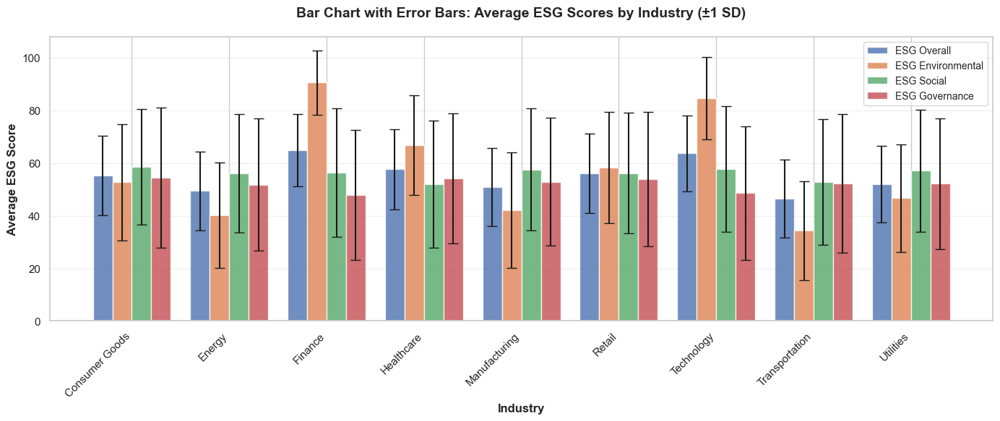

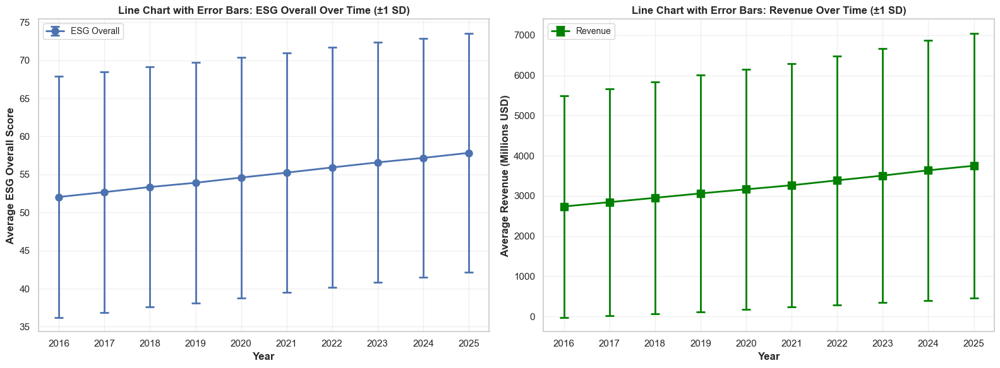

In [29]:
# Error Bar Chart: Average ESG Scores by Industry with Standard Deviation
industry_stats = df.groupby('Industry').agg({
    'ESG_Overall': ['mean', 'std'],
    'ESG_Environmental': ['mean', 'std'],
    'ESG_Social': ['mean', 'std'],
    'ESG_Governance': ['mean', 'std']
}).reset_index()

industry_stats.columns = ['Industry', 'ESG_Overall_mean', 'ESG_Overall_std',
                         'ESG_Environmental_mean', 'ESG_Environmental_std',
                         'ESG_Social_mean', 'ESG_Social_std',
                         'ESG_Governance_mean', 'ESG_Governance_std']

fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(len(industry_stats['Industry']))
width = 0.2

ax.bar(x - 1.5*width, industry_stats['ESG_Overall_mean'], width, yerr=industry_stats['ESG_Overall_std'],
       label='ESG Overall', alpha=0.8, capsize=5)
ax.bar(x - 0.5*width, industry_stats['ESG_Environmental_mean'], width, 
       yerr=industry_stats['ESG_Environmental_std'], label='ESG Environmental', alpha=0.8, capsize=5)
ax.bar(x + 0.5*width, industry_stats['ESG_Social_mean'], width, yerr=industry_stats['ESG_Social_std'],
       label='ESG Social', alpha=0.8, capsize=5)
ax.bar(x + 1.5*width, industry_stats['ESG_Governance_mean'], width, 
       yerr=industry_stats['ESG_Governance_std'], label='ESG Governance', alpha=0.8, capsize=5)

ax.set_xlabel('Industry', fontsize=12, fontweight='bold')
ax.set_ylabel('Average ESG Score', fontsize=12, fontweight='bold')
ax.set_title('Bar Chart with Error Bars: Average ESG Scores by Industry (±1 SD)', 
             fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(industry_stats['Industry'], rotation=45, ha='right')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Line Chart with Error Bars: ESG Scores Over Time
yearly_stats = df.groupby('Year').agg({
    'ESG_Overall': ['mean', 'std'],
    'Revenue': ['mean', 'std']
}).reset_index()

yearly_stats.columns = ['Year', 'ESG_Overall_mean', 'ESG_Overall_std', 'Revenue_mean', 'Revenue_std']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ESG Overall over time with error bars
axes[0].errorbar(yearly_stats['Year'], yearly_stats['ESG_Overall_mean'], 
                yerr=yearly_stats['ESG_Overall_std'], marker='o', capsize=5, capthick=2,
                linewidth=2, markersize=8, label='ESG Overall')
axes[0].set_xlabel('Year', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Average ESG Overall Score', fontsize=12, fontweight='bold')
axes[0].set_title('Line Chart with Error Bars: ESG Overall Over Time (±1 SD)', 
                 fontsize=12, fontweight='bold')
axes[0].legend(loc='best', fontsize=10)
axes[0].grid(True, alpha=0.3)
axes[0].set_xticks(yearly_stats['Year'])

# Revenue over time with error bars
axes[1].errorbar(yearly_stats['Year'], yearly_stats['Revenue_mean'], 
                yerr=yearly_stats['Revenue_std'], marker='s', capsize=5, capthick=2,
                linewidth=2, markersize=8, color='green', label='Revenue')
axes[1].set_xlabel('Year', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Average Revenue (Millions USD)', fontsize=12, fontweight='bold')
axes[1].set_title('Line Chart with Error Bars: Revenue Over Time (±1 SD)', 
                 fontsize=12, fontweight='bold')
axes[1].legend(loc='best', fontsize=10)
axes[1].grid(True, alpha=0.3)
axes[1].set_xticks(yearly_stats['Year'])

plt.tight_layout()
plt.show()

# Interactive Error Bar Chart using Plotly
fig_error = go.Figure()

for esg_type in ['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']:
    industry_agg = df.groupby('Industry')[esg_type].agg(['mean', 'std']).reset_index()
    fig_error.add_trace(go.Bar(
        name=esg_type,
        x=industry_agg['Industry'],
        y=industry_agg['mean'],
        error_y=dict(type='data', array=industry_agg['std']),
        text=industry_agg['mean'].round(2),
        textposition='outside'
    ))

fig_error.update_layout(
    title='Interactive Bar Chart with Error Bars: ESG Scores by Industry',
    xaxis_title='Industry',
    yaxis_title='Average ESG Score',
    barmode='group',
    font_size=12,
    title_font_size=16,
    height=600,
    xaxis_tickangle=-45
)
fig_error.show()


### 7. Additional Interactive Visualizations


In [30]:
# Interactive Heatmap: Correlation Matrix
correlation_matrix = df.select_dtypes(include=[np.number]).corr()

fig_heatmap = px.imshow(correlation_matrix, 
                        labels=dict(x="Feature", y="Feature", color="Correlation"),
                        x=correlation_matrix.columns,
                        y=correlation_matrix.columns,
                        color_continuous_scale='RdBu',
                        aspect="auto",
                        title='Interactive Correlation Heatmap')
fig_heatmap.update_layout(font_size=12, title_font_size=16, height=700)
fig_heatmap.show()

# Interactive Sunburst Chart: Hierarchical view of Industry and Region
industry_region_counts = df.groupby(['Industry', 'Region']).size().reset_index(name='Count')
fig_sunburst = px.sunburst(industry_region_counts, path=['Industry', 'Region'], values='Count',
                          title='Interactive Sunburst Chart: Company Distribution by Industry and Region',
                          color='Count', color_continuous_scale='Viridis')
fig_sunburst.update_layout(font_size=12, title_font_size=16, height=700)
fig_sunburst.show()

# Interactive Violin Plot: Distribution of ESG Scores by Industry
melted_esg = df.melt(id_vars=['Industry', 'Region'], 
                    value_vars=['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance'],
                    var_name='ESG_Type', value_name='Score')

fig_violin = px.violin(melted_esg, x='Industry', y='Score', color='ESG_Type',
                      box=True, points='all',
                      title='Interactive Violin Plot: ESG Score Distributions by Industry',
                      labels={'Score': 'ESG Score', 'Industry': 'Industry', 'ESG_Type': 'ESG Component'})
fig_violin.update_layout(font_size=12, title_font_size=16, height=600, xaxis_tickangle=-45)
fig_violin.show()

# Interactive Parallel Coordinates Plot
fig_parallel = px.parallel_coordinates(df, 
                                      dimensions=['Revenue', 'ProfitMargin', 'ESG_Overall', 
                                                'CarbonEmissions', 'MarketCap'],
                                      color='ESG_Overall',
                                      color_continuous_scale='Viridis',
                                      title='Interactive Parallel Coordinates: Multi-dimensional Analysis',
                                      labels={'Revenue': 'Revenue', 'ProfitMargin': 'Profit Margin',
                                             'ESG_Overall': 'ESG Overall', 'CarbonEmissions': 'Carbon Emissions',
                                             'MarketCap': 'Market Cap'})
fig_parallel.update_layout(font_size=12, title_font_size=16, height=600)
fig_parallel.show()


## Summary and Key Insights

### Data Quality Summary
- **Initial Dataset**: 11,000 rows, 16 columns
- **Missing Values**: Handled GrowthRate NaN values (1,000 rows from 2015)
- **Duplicates**: Checked and removed if any
- **Outliers**: Capped using IQR method for key financial and environmental metrics
- **Data Validation**: All ESG scores validated to be within [0, 100] range
- **Final Clean Dataset**: Ready for analysis

### Preprocessing Summary
- **Categorical Encoding**: One-hot encoded Industry and Region
- **Normalization**: Created Min-Max normalized version (0-1 range)
- **Standardization**: Created Z-score standardized version (mean=0, std=1)
- **All Features**: Converted to numerical format

### Key Findings from EDA
1. **ESG Trends**: ESG scores show improvement over time across all components
2. **Industry Variations**: Significant differences in ESG performance across industries
3. **Financial-ESG Relationship**: Positive correlation between ESG scores and financial performance
4. **Regional Patterns**: Different regions show varying ESG and financial metrics
5. **Environmental Impact**: Strong negative correlation between ESG Environmental scores and carbon emissions

### Visualization Coverage
✅ Pie charts (Industry and Region distribution)
✅ Box plots (ESG scores, Revenue, Profit Margin, Carbon Emissions)
✅ Line charts (ESG trends over time)
✅ Multi-line charts (Revenue and Market Cap by Region)
✅ Bar charts (Grouped: ESG by Industry)
✅ Stacked bar charts (Environmental impact by Industry)
✅ Scatter plots (ESG vs Financial metrics)
✅ Bubble charts (Revenue vs ESG with Market Cap and Profit Margin)
✅ Error bar charts (ESG scores with standard deviation)
✅ Interactive charts (Plotly visualizations throughout)


# “When is feature engineering a nice-to-have option, and when is it a must-have?”

---

**Feature engineering is a *nice-to-have* when:**

1. **We’re using highly expressive models** (e.g., deep learning, gradient boosting) that naturally learn complex patterns from raw data.
2. **The dataset is large and rich**, so the model can discover structure without heavy manual intervention.
3. **Time-to-delivery is more important than squeezing every bit of performance**, such as early prototyping or hackathon-style work.
4. **The raw features already carry strong predictive signal**, and baseline models perform adequately.

---

**Feature engineering is a *must-have* when:**

1. **We use simpler or linear models** (e.g., OLS, logistic regression) that cannot learn nonlinearities, interactions, or transformations on their own.
2. **Signal-to-noise is low**, and domain knowledge is needed to extract meaningful structure.
3. **The dataset is small**, so the model needs human-designed features to generalize well.
4. **Interpretability is crucial**—features must reflect economic, financial, or domain-specific constructs (common in finance, econometrics, and causal inference).
5. **Raw data is messy or unstructured** (e.g., transactions, text, time-series), requiring transformation into usable predictors.
6. **Regulatory or academic requirements** demand transparent, explainable inputs—common in empirical finance.

---


